In [1]:
# Make sure that the funcs module is reloaded every time it's updated
%load_ext autoreload
%autoreload 2

# Interactive figures
#%matplotlib qt
%matplotlib inline

In [2]:
# Import modules
import numpy as np
import matplotlib.pyplot as plt
from funcs import *
import astropy.cosmology as cosmo
import astropy.units as u
import astropy.constants as const
import pandas as pd
import scipy.stats as stats


In [3]:
# Font sizes
plt.rc('font', size=12)
plt.rc('axes', labelsize=12)
plt.rc('figure', titlesize=12)

# Part A

In [4]:
# Import the spectral data 
sn1997bp_spec = np.loadtxt('SN_spectra/sn1997bp_spec.ascii', unpack=True)
sn1997E_spec = np.loadtxt('SN_spectra/sn1997E_spec.ascii', unpack=True)
sn1998es_spec = np.loadtxt('SN_spectra/sn1998es_spec.ascii', unpack=True)
sn1999aa_spec = np.loadtxt('SN_spectra/sn1999aa_spec.ascii', unpack=True)
sn1999dq_spec = np.loadtxt('SN_spectra/sn1999dq_spec.ascii', unpack=True)
sn2000cn_spec = np.loadtxt('SN_spectra/sn2000cn_spec.ascii', unpack=True)
sn2000dk_spec = np.loadtxt('SN_spectra/sn2000dk_spec.ascii', unpack=True)

names = ['SN1997bp', 'SN1997E', 'SN1998es', 'SN1999aa', 'SN1999dq', 'SN2000cn', 'SN2000dk']

sne_wl = np.array([sn1997bp_spec[0], sn1997E_spec[0], sn1998es_spec[0], sn1999aa_spec[0], sn1999dq_spec[0], sn2000cn_spec[0], sn2000dk_spec[0]], dtype=object)

# Normalise the intensities
sne_intensity = np.array([sn1997bp_spec[1]/np.amax(sn1997bp_spec[1]), sn1997E_spec[1]/np.amax(sn1997E_spec[1]), sn1998es_spec[1]/np.amax(sn1998es_spec[1]), sn1999aa_spec[1]/np.amax(sn1999aa_spec[1]), sn1999dq_spec[1]/np.amax(sn1999dq_spec[1]), sn2000cn_spec[1]/np.amax(sn2000cn_spec[1]), sn2000dk_spec[1]/np.amax(sn2000dk_spec[1])], dtype=object)

In [5]:
# Define the galaxy lines

g_line_wl = np.loadtxt('Galaxy_lines.txt', skiprows=1, usecols=1)

Hgamma = g_line_wl[0]
Hbeta = g_line_wl[1]
Halpha = g_line_wl[2]
NIIa = g_line_wl[3] 
NIIb = g_line_wl[4]
OII = g_line_wl[5]
OIIIa = g_line_wl[6] 
OIIIb = g_line_wl[7]
NaIa = g_line_wl[8] 
NaIb = g_line_wl[9]
MgII = g_line_wl[10]
SIIa = g_line_wl[11] 
SIIb = g_line_wl[12]
CaIIa = g_line_wl[13] 
CaIIb = g_line_wl[14]

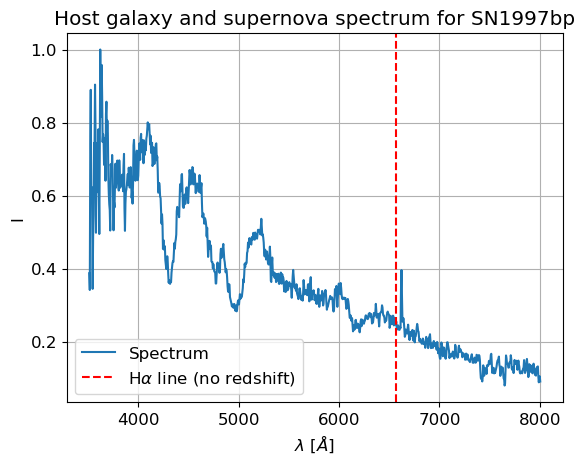

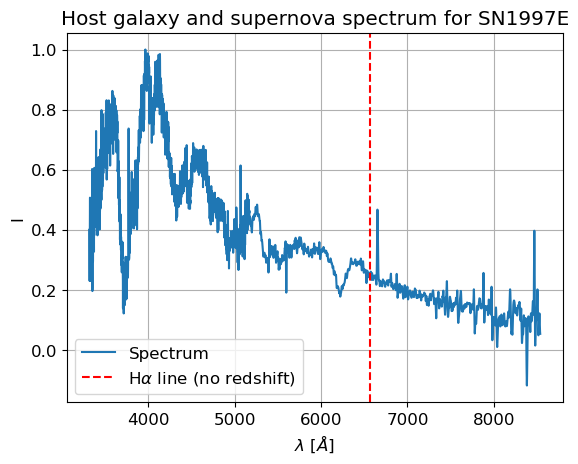

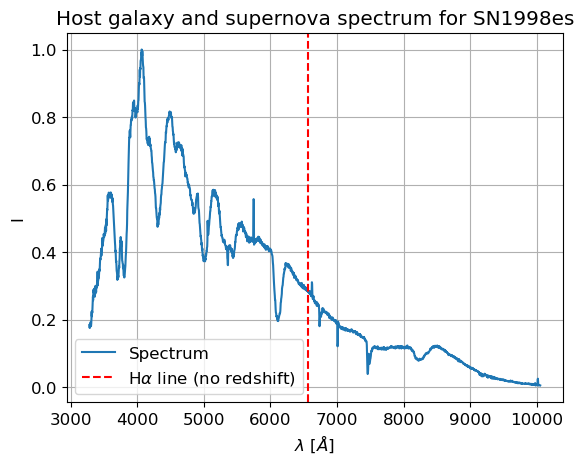

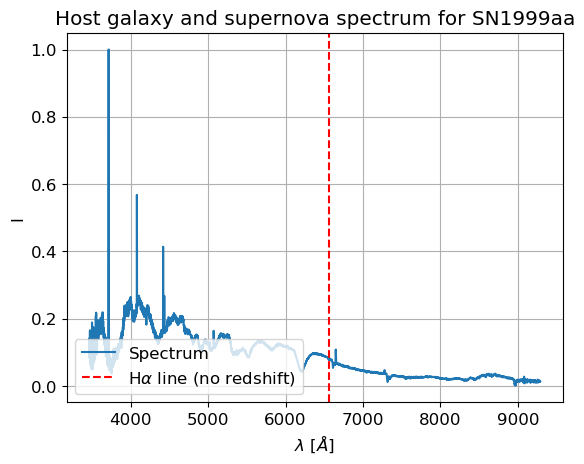

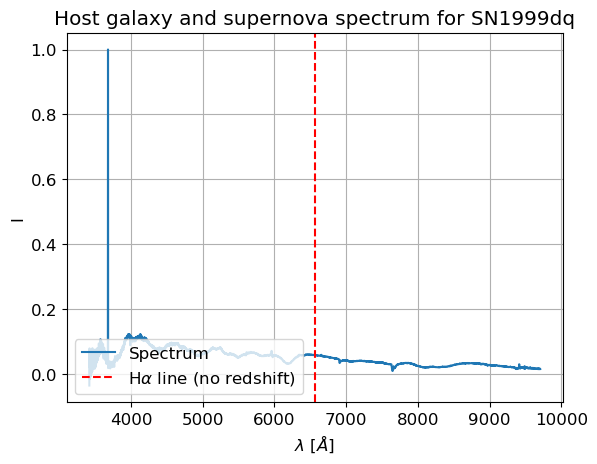

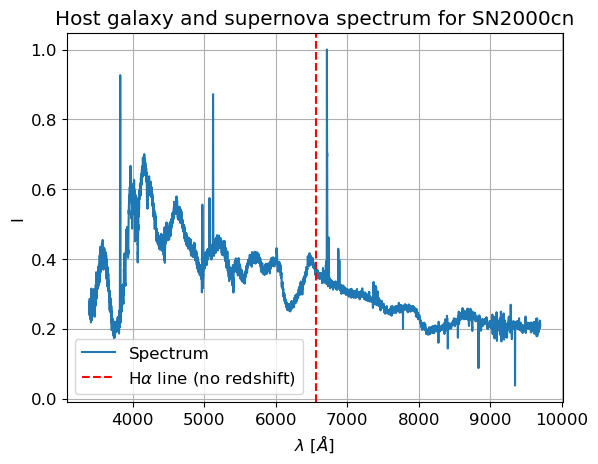

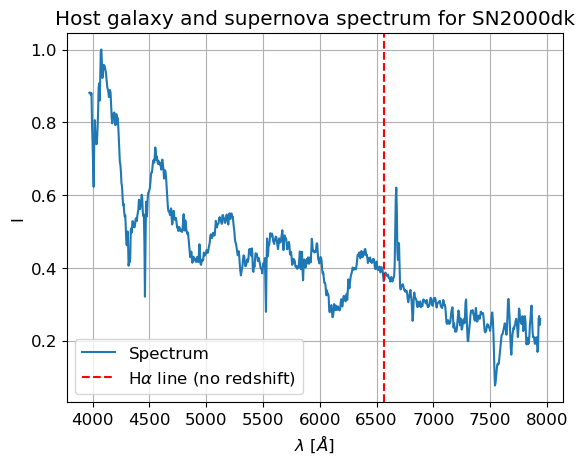

In [6]:
# Plot all spectra and the H alpha line
for i in range(len(sne_wl)):
    plt.plot(sne_wl[i], sne_intensity[i], label='Spectrum')
    plt.axvline(Halpha, c='red', ls='--', label=r'H$\alpha$ line (no redshift)')
    plt.title(f'Host galaxy and supernova spectrum for {names[i]}')
    plt.xlabel(r'$\lambda$ [$\AA$]')
    plt.ylabel('I')
    plt.legend(loc=3)
    plt.grid()
    plt.show()

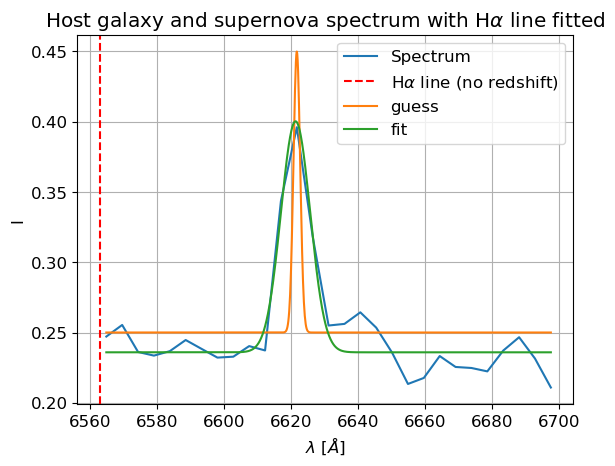

In [7]:
# Fit a Gaussian to (what looks to be) the H alpha line - intitial fitting, without the function
index = (sn1997bp_spec[0] >= Halpha) * (sn1997bp_spec[0] <= 6700)

sn1997bp_spec[1] = sn1997bp_spec[1] / np.amax(sn1997bp_spec[1])

wavelength = sn1997bp_spec[0][index]
intensity = sn1997bp_spec[1][index]

# array for plotting the guess and fit
wl = np.linspace(min(wavelength), max(wavelength), 1000)

peak_guess = np.argmax(intensity)

p0 = [0.2, wavelength[peak_guess], 1, 0.25]

p_fit = fitting(p0, wavelength, intensity, gauss)

plt.plot(wavelength, intensity, label='Spectrum')
plt.axvline(Halpha, c='red', ls='--', label=r'H$\alpha$ line (no redshift)')
plt.title(r'Host galaxy and supernova spectrum with H$\alpha$ line fitted')
plt.xlabel(r'$\lambda$ [$\AA$]')
plt.ylabel('I')

# Plot guess and fit
plt.plot(wl, gauss(p0, wl), label='guess')
plt.plot(wl, gauss(p_fit, wl), label='fit')
plt.grid()
plt.legend()


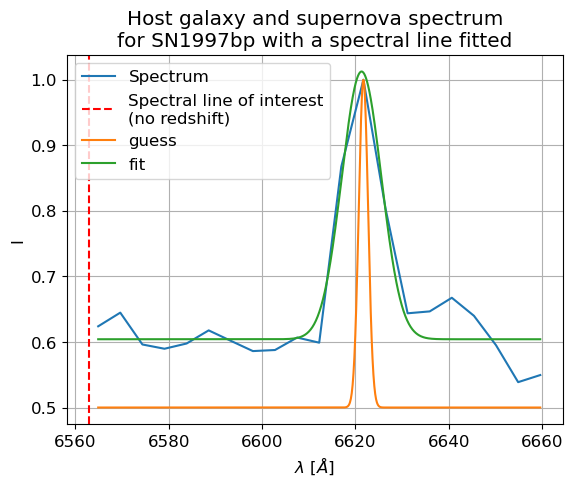

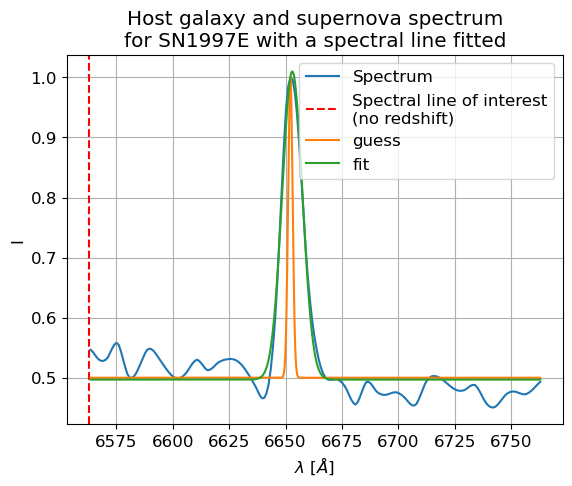

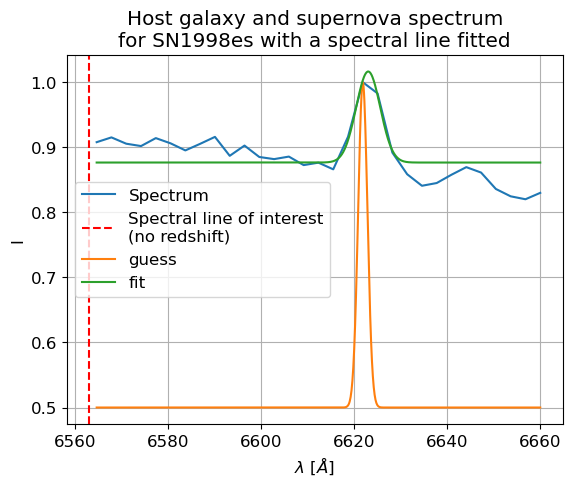

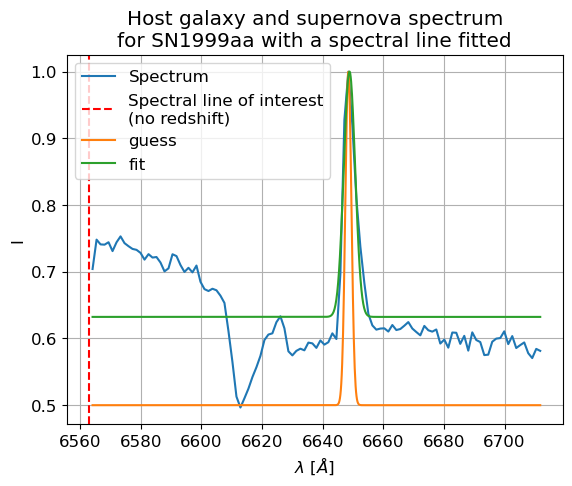

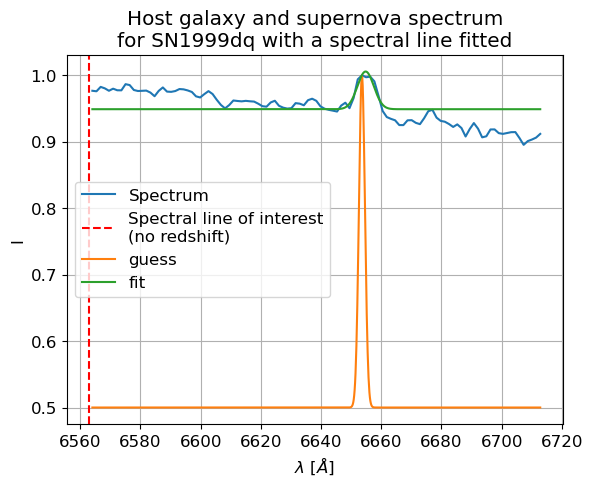

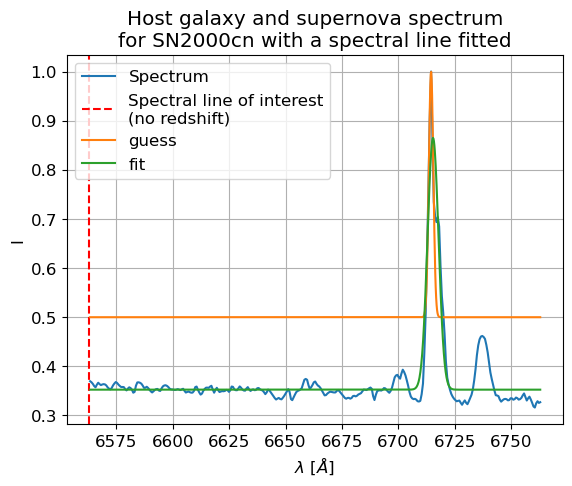

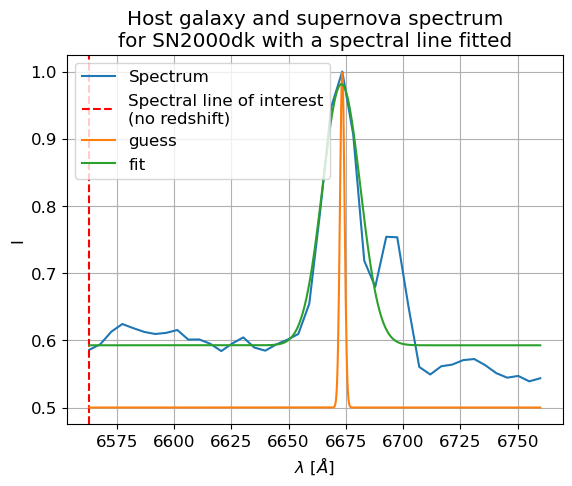

In [8]:
# Fit the Gaussian to the H alpha lines for all spectra using a function
ends = [100, 200, 100, 150, 150, 200, 200]

for i in range(len(sne_wl)):
    fit_line_red_plotting(sne_wl[i], sne_intensity[i], Halpha, names[i], end=ends[i])

In [9]:
# Find the redshifts from the H alpha

# Store in arrays

z_Halpha = np.array([])
z_Halpha_unc = np.array([])

for i in range(len(sne_wl)):
    red_shift, red_shift_unc = find_redshift(sne_wl[i], sne_intensity[i], Halpha, end=ends[i])
    red_shift, red_shift_unc = round_sig_fig_uncertainty(red_shift, red_shift_unc)
    
    z_Halpha = np.append(z_Halpha, red_shift)
    z_Halpha_unc = np.append(z_Halpha_unc, red_shift_unc)

print('When fitting the H alpha line:')
for i in range(len(z_Halpha)):
    print(f'\tThe red shift of {names[i]} is {z_Halpha[i]} \u00B1 {z_Halpha_unc[i]}')

When fitting the H alpha line:
	The red shift of SN1997bp is 0.0089 ± 0.0015
	The red shift of SN1997E is 0.0137 ± 0.0016
	The red shift of SN1998es is 0.0091 ± 0.0009
	The red shift of SN1999aa is 0.0131 ± 0.0007
	The red shift of SN1999dq is 0.014 ± 0.001
	The red shift of SN2000cn is 0.0232 ± 0.0009
	The red shift of SN2000dk is 0.017 ± 0.003


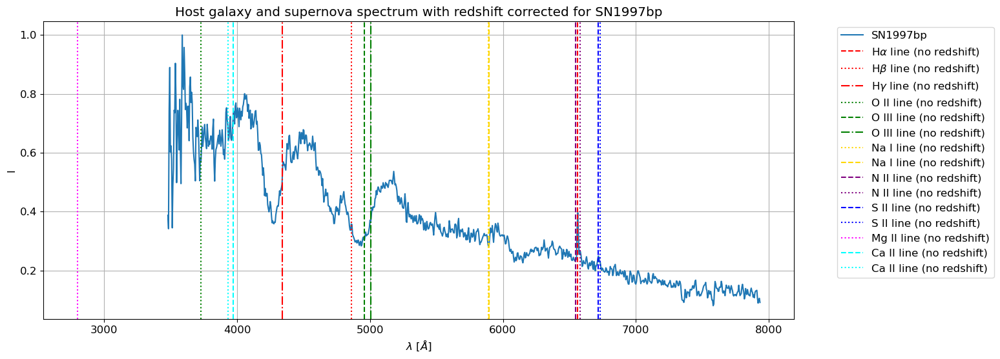

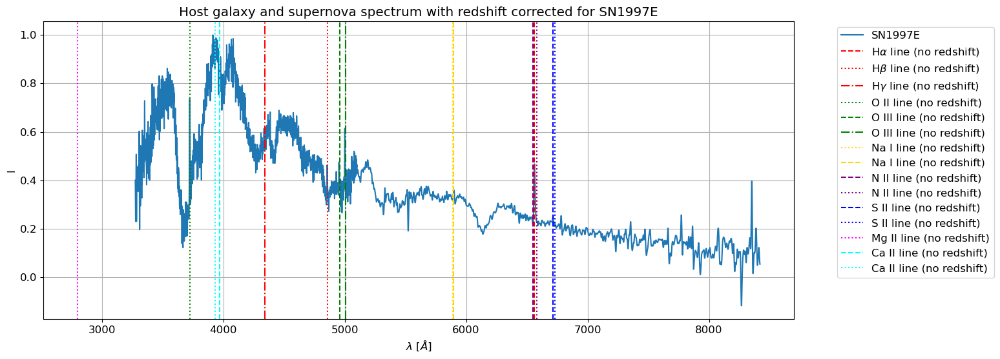

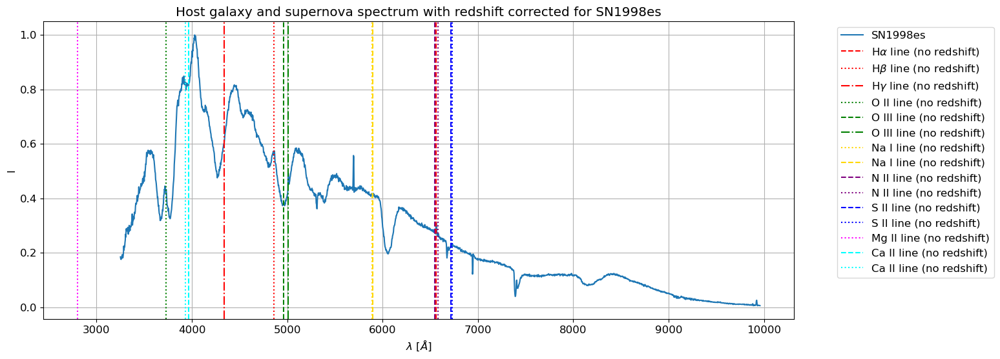

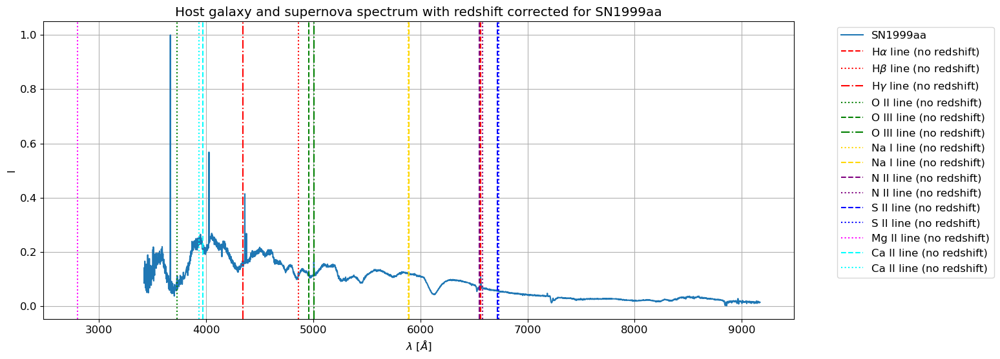

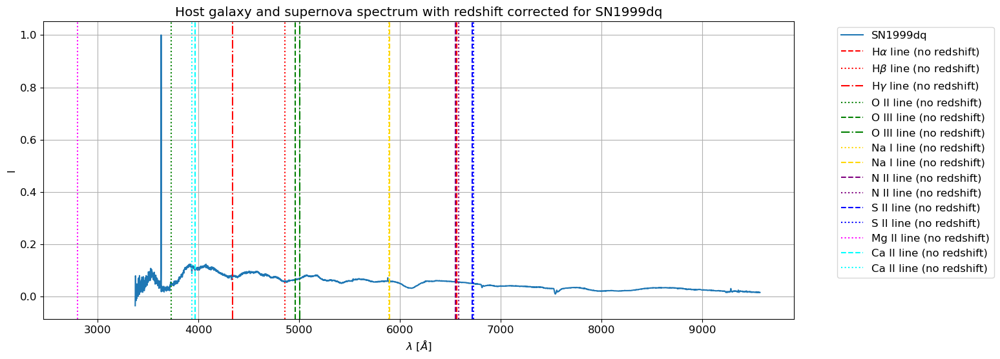

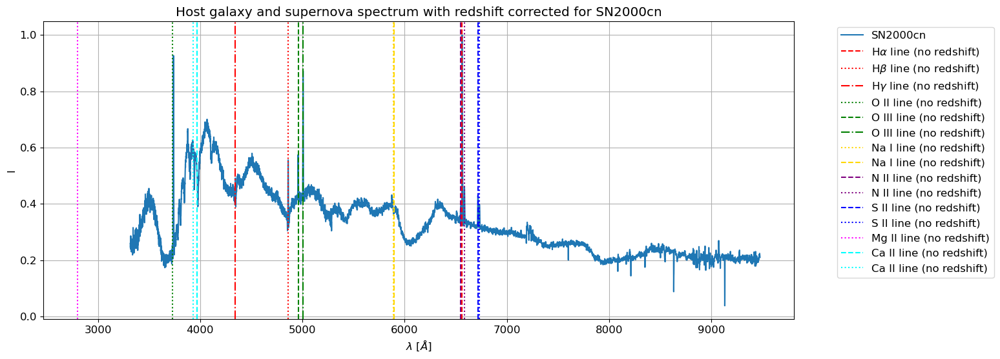

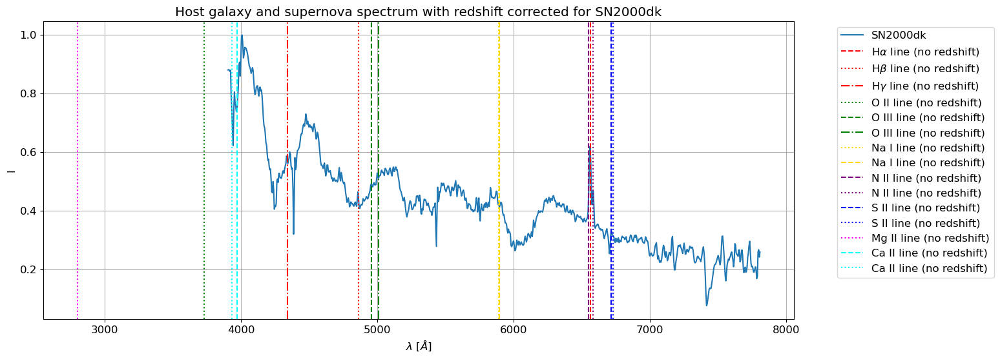

In [10]:
# Plot spectra corrected for redshift with other spectral lines
# See which lines can be fit
sne_wl_corrected = sne_wl / (1 + z_Halpha)

for i in range(len(sne_wl_corrected)):
    plt.figure(figsize=(15,6))

    plt.plot(sne_wl_corrected[i], sne_intensity[i], label=names[i])
    plt.title(f'Host galaxy and supernova spectrum with redshift corrected for {names[i]}')
    plt.xlabel(r'$\lambda$ [$\AA$]')
    plt.ylabel('I')

    plt.axvline(Halpha, c='red', ls='--', label=r'H$\alpha$ line (no redshift)')
    plt.axvline(Hbeta, c='red', ls=':', label=r'H$\beta$ line (no redshift)')
    plt.axvline(Hgamma, c='red', ls='-.', label=r'H$\gamma$ line (no redshift)')

    plt.axvline(OII, c='green', ls=':', label=r'O II line (no redshift)')
    plt.axvline(OIIIa, c='green', ls='--', label=r'O III line (no redshift)')
    plt.axvline(OIIIb, c='green', ls='-.', label=r'O III line (no redshift)')

    plt.axvline(NaIa, c='gold', ls=':', label=r'Na I line (no redshift)')
    plt.axvline(NaIb, c='gold', ls='--', label=r'Na I line (no redshift)')

    plt.axvline(NIIa, c='purple', ls='--', label=r'N II line (no redshift)')
    plt.axvline(NIIb, c='purple', ls=':', label=r'N II line (no redshift)')

    plt.axvline(SIIa, c='blue', ls='--', label=r'S II line (no redshift)')
    plt.axvline(SIIb, c='blue', ls=':', label=r'S II line (no redshift)')

    plt.axvline(MgII, c='magenta', ls=':', label=r'Mg II line (no redshift)')

    plt.axvline(CaIIa, c='cyan', ls='--', label=r'Ca II line (no redshift)')
    plt.axvline(CaIIb, c='cyan', ls=':', label=r'Ca II line (no redshift)')
    plt.grid()

    plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
    
    if names[i] == 'sn1999aa' or names[i] == 'sn1999dq':
        plt.ylim([0, 0.4])

    plt.show()

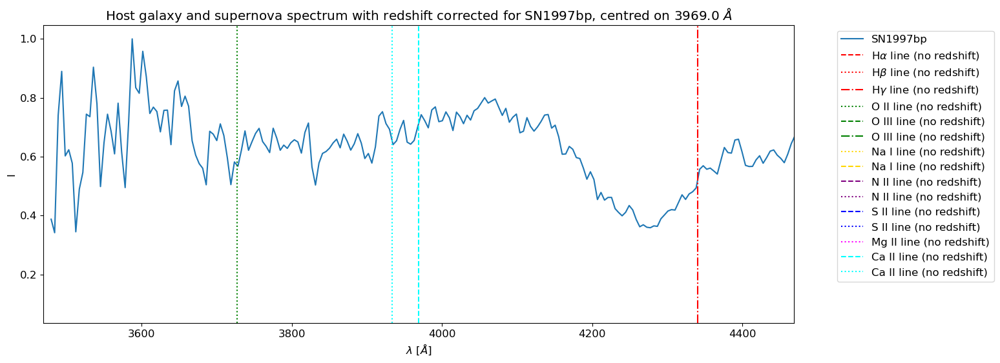

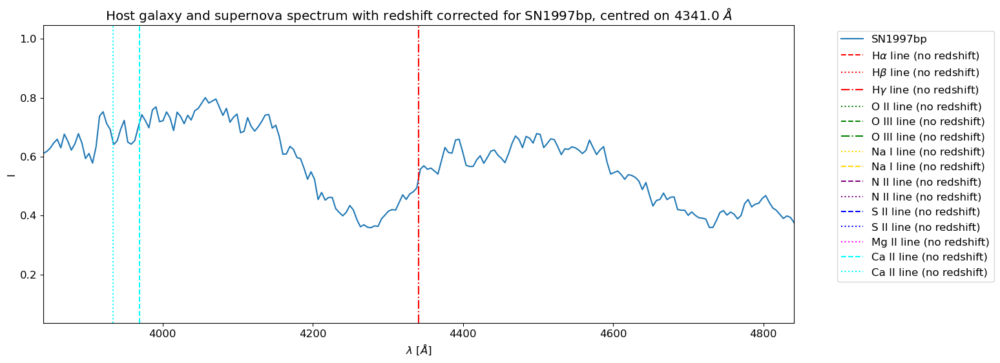

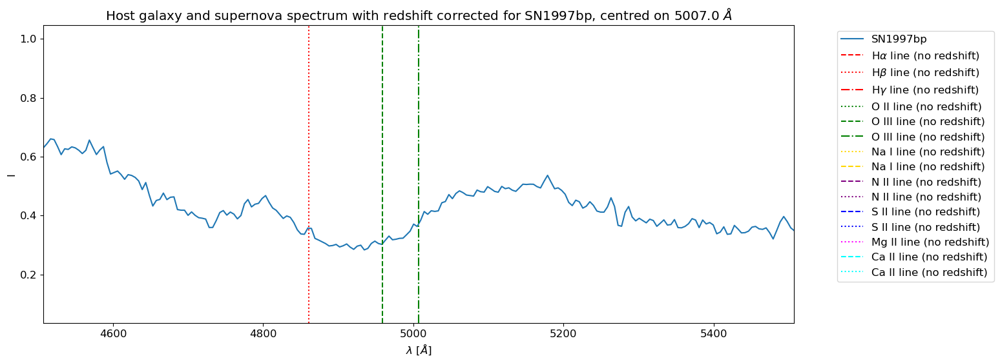

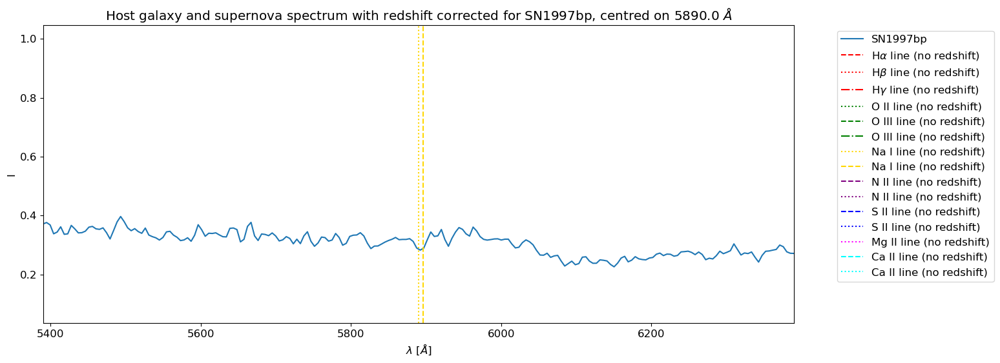

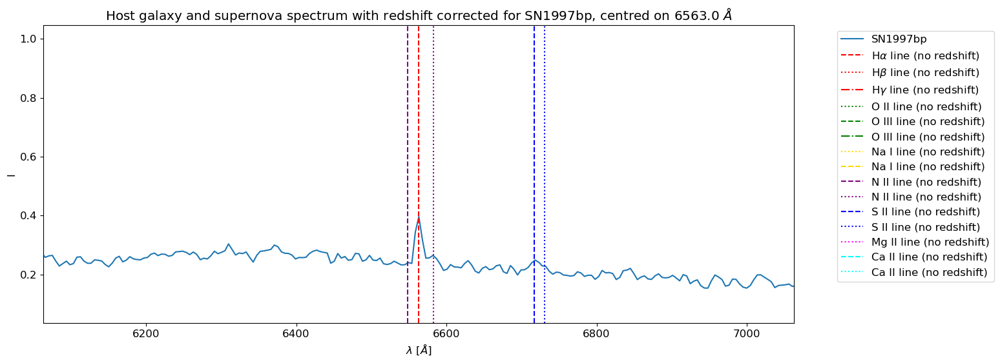

...

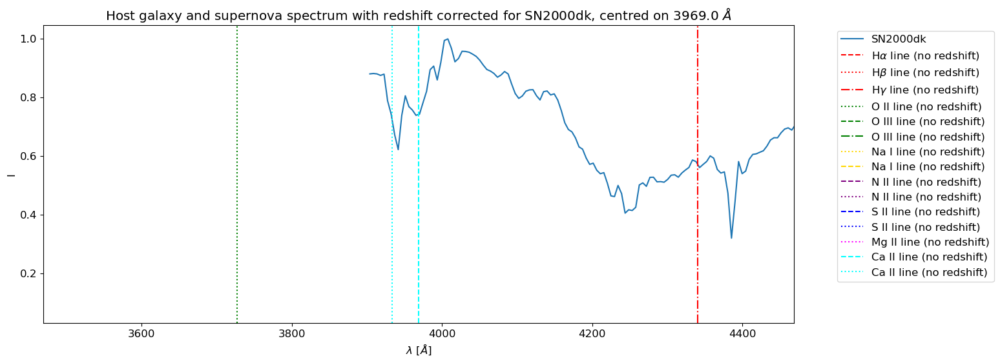

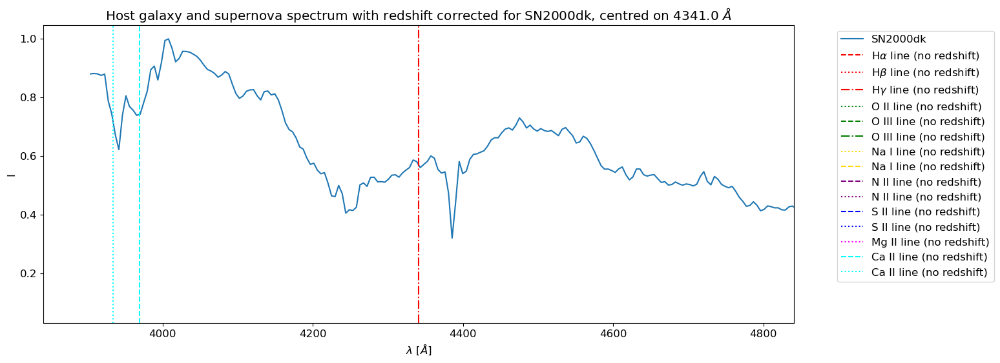

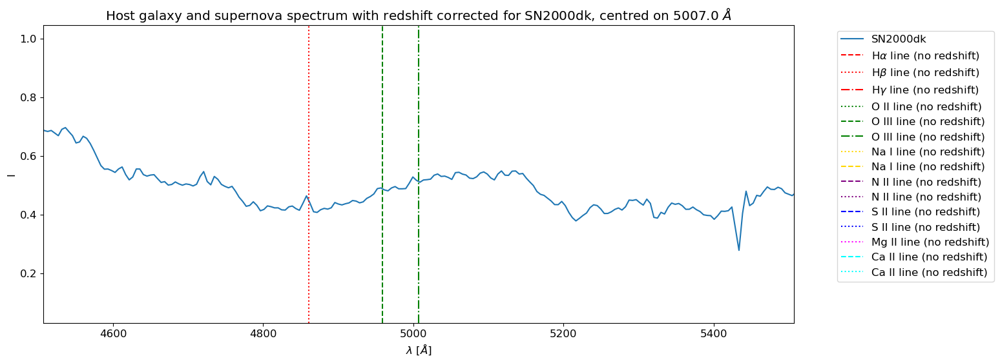

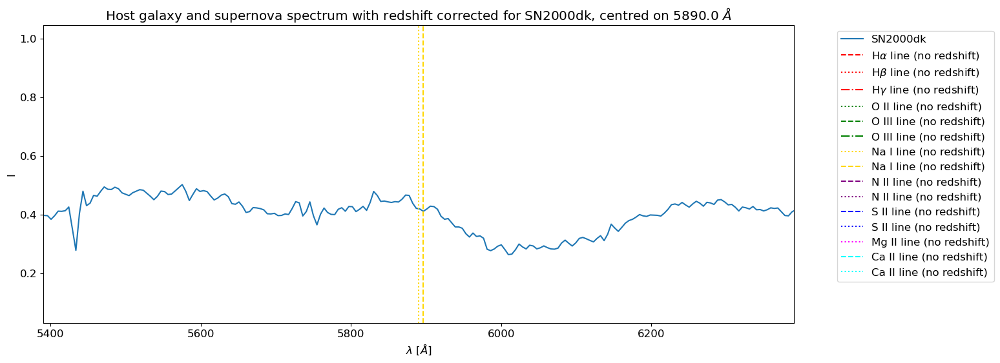

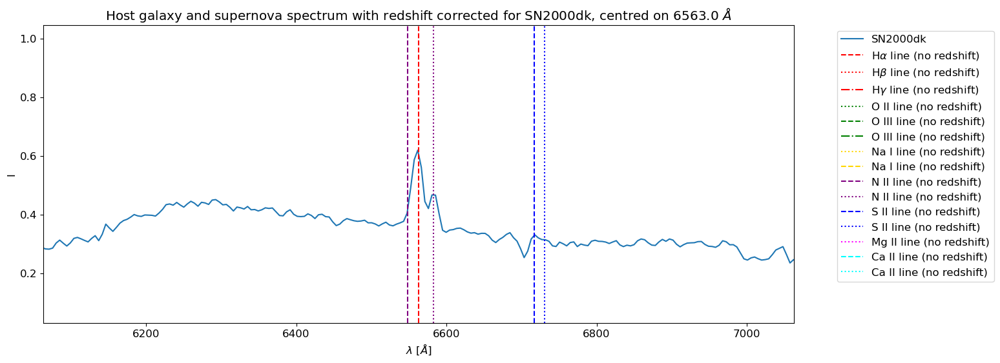

In [11]:
# Plot spectra corrected for redshift with other spectral lines zoomed in on particular lines
# See which lines can be fit
sne_wl_corrected = sne_wl / (1 + z_Halpha)

lines_to_plot_around = [CaIIa, Hgamma, OIIIb, NaIa, Halpha]

for i in range(len(sne_wl_corrected)):
    for j in range(len(lines_to_plot_around)):
        plt.figure(figsize=(15,6))

        plt.plot(sne_wl_corrected[i], sne_intensity[i], label=names[i])
        plt.title(f'Host galaxy and supernova spectrum with redshift corrected for {names[i]}, centred on {lines_to_plot_around[j]} $\AA$')
        plt.xlabel(r'$\lambda$ [$\AA$]')
        plt.ylabel('I')

        plt.axvline(Halpha, c='red', ls='--', label=r'H$\alpha$ line (no redshift)')
        plt.axvline(Hbeta, c='red', ls=':', label=r'H$\beta$ line (no redshift)')
        plt.axvline(Hgamma, c='red', ls='-.', label=r'H$\gamma$ line (no redshift)')

        plt.axvline(OII, c='green', ls=':', label=r'O II line (no redshift)')
        plt.axvline(OIIIa, c='green', ls='--', label=r'O III line (no redshift)')
        plt.axvline(OIIIb, c='green', ls='-.', label=r'O III line (no redshift)')

        plt.axvline(NaIa, c='gold', ls=':', label=r'Na I line (no redshift)')
        plt.axvline(NaIb, c='gold', ls='--', label=r'Na I line (no redshift)')

        plt.axvline(NIIa, c='purple', ls='--', label=r'N II line (no redshift)')
        plt.axvline(NIIb, c='purple', ls=':', label=r'N II line (no redshift)')

        plt.axvline(SIIa, c='blue', ls='--', label=r'S II line (no redshift)')
        plt.axvline(SIIb, c='blue', ls=':', label=r'S II line (no redshift)')

        plt.axvline(MgII, c='magenta', ls=':', label=r'Mg II line (no redshift)')

        plt.axvline(CaIIa, c='cyan', ls='--', label=r'Ca II line (no redshift)')
        plt.axvline(CaIIb, c='cyan', ls=':', label=r'Ca II line (no redshift)')

        plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

        plt.xlim([lines_to_plot_around[j] - 500, lines_to_plot_around[j] + 500])
        
        if names[i] == 'sn1999aa' or names[i] == 'sn1999dq':
            plt.ylim([0, 0.4])

        plt.show()

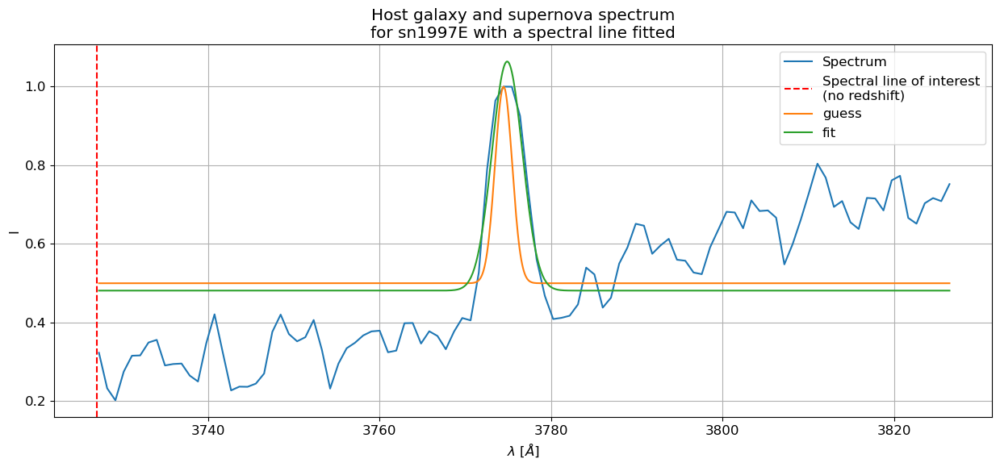

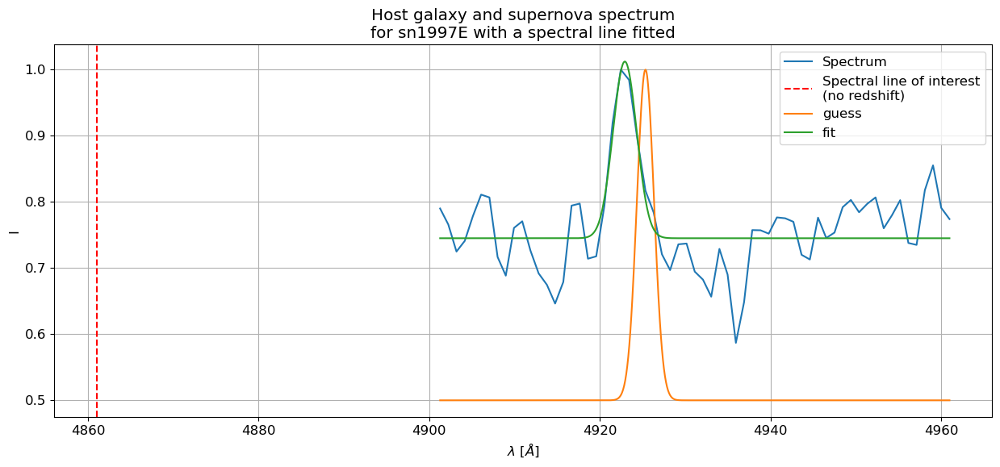

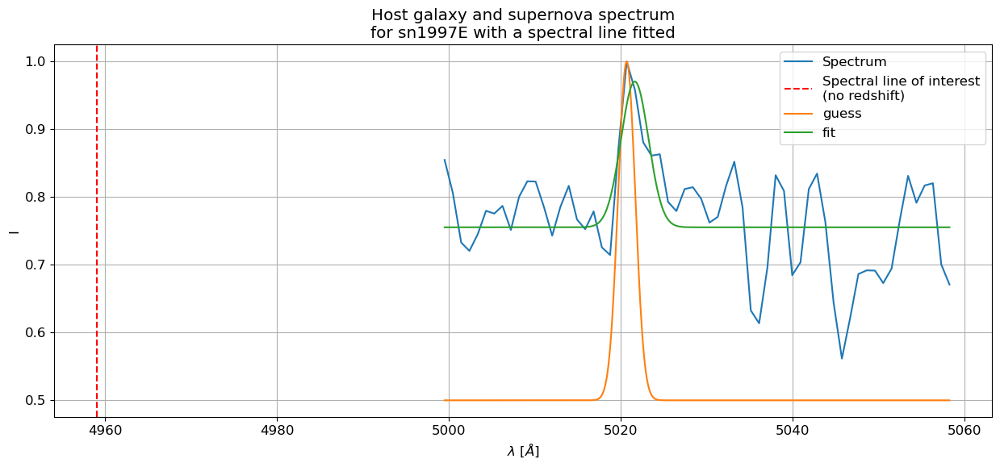

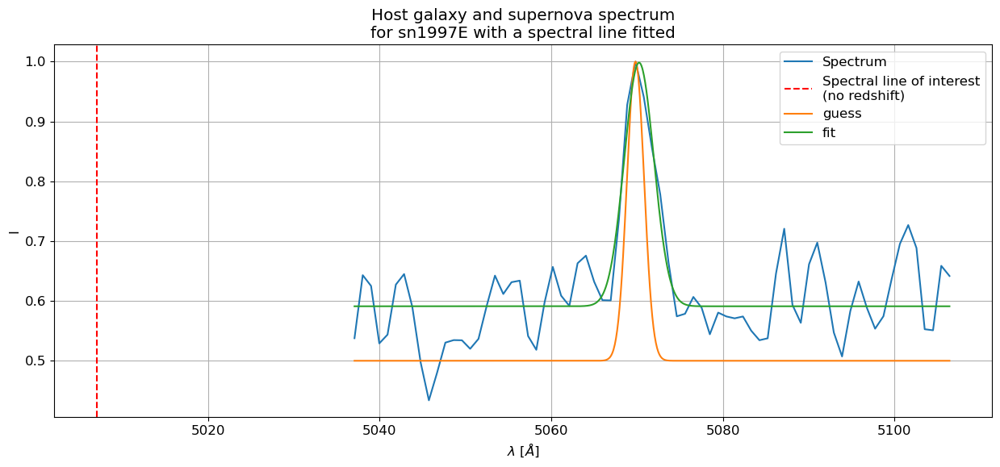

In [12]:
# Fit extra lines for sn1997E
plt.figure(figsize=(15,6))
fit_line_red_plotting(sn1997E_spec[0], sn1997E_spec[1], OII, 'sn1997E', end=100)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn1997E_spec[0], sn1997E_spec[1], Hbeta, 'sn1997E', start=40, end=100, centre=4925)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn1997E_spec[0], sn1997E_spec[1], OIIIa, 'sn1997E', start=40, end=100, centre=5020)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn1997E_spec[0], sn1997E_spec[1], OIIIb, 'sn1997E', start=30, end=100)

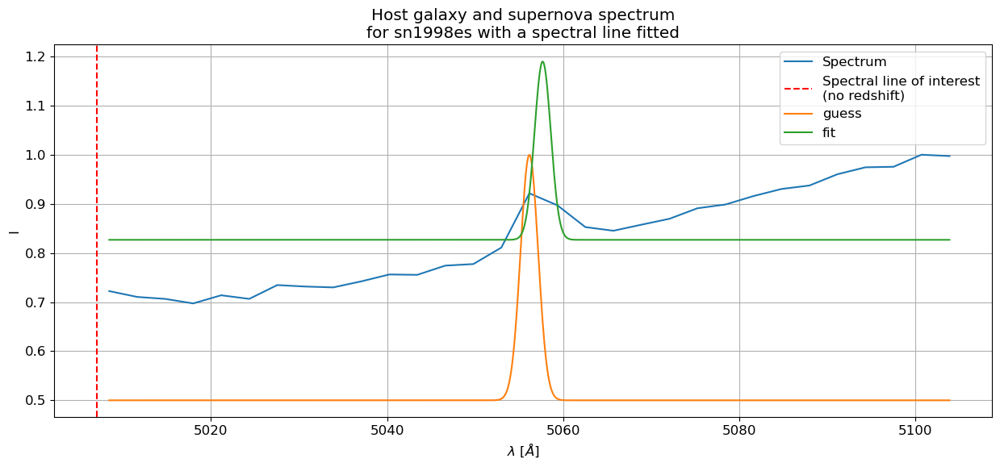

In [13]:
# Fit extra line for sn1998es
plt.figure(figsize=(15,6))
fit_line_red_plotting(sn1998es_spec[0], sn1998es_spec[1], OIIIb, 'sn1998es', end=100, centre=5055)


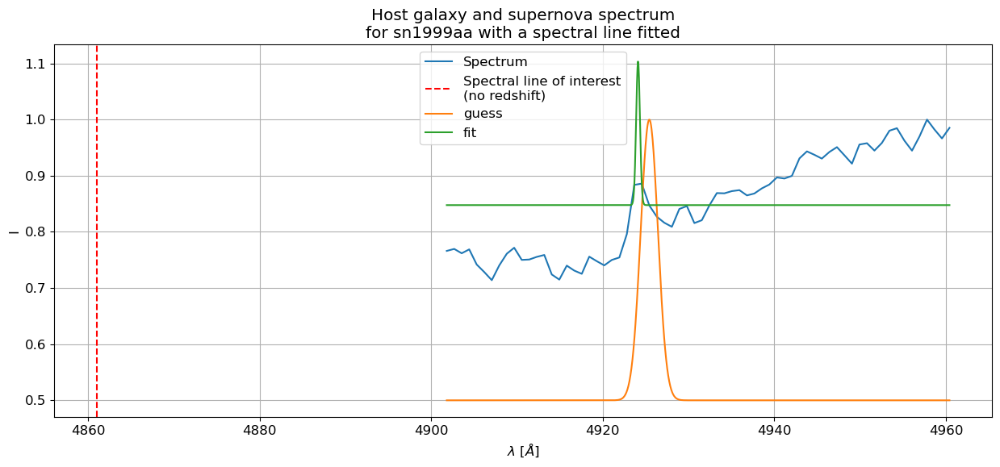

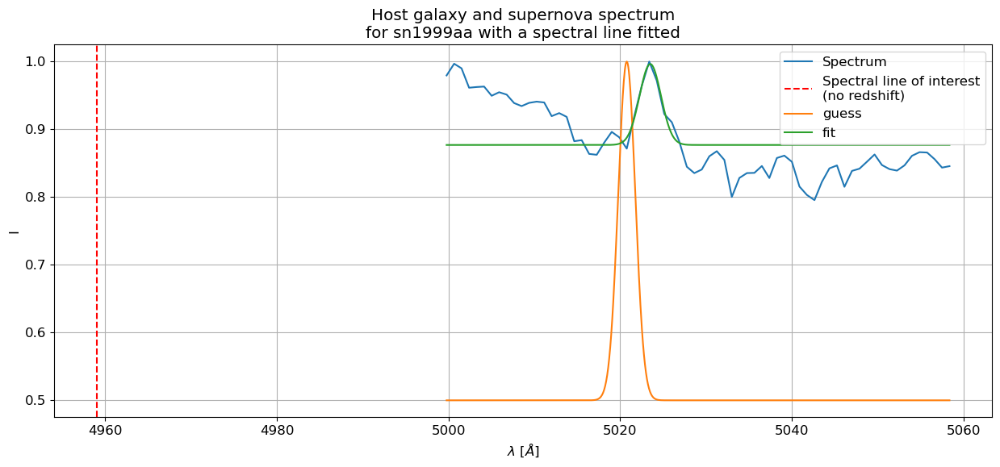

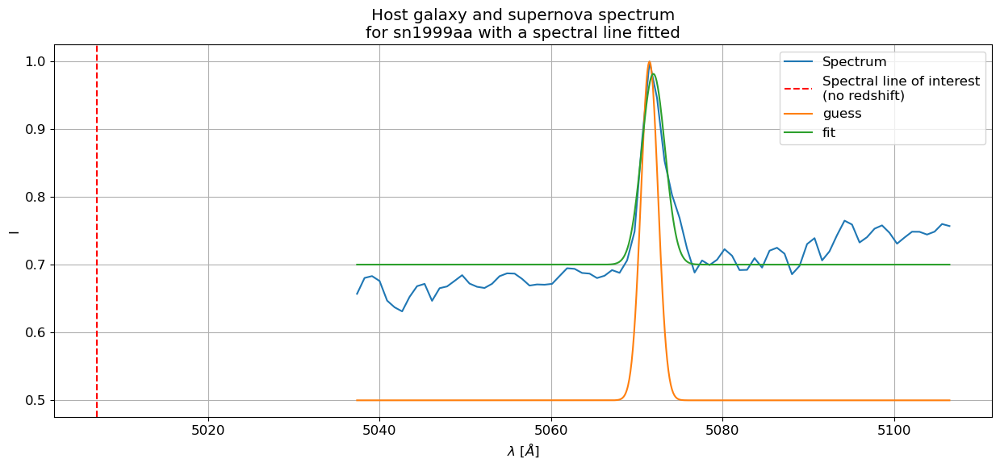

In [14]:
# Fit extra lines for sn1999aa
plt.figure(figsize=(15,6))
fit_line_red_plotting(sn1999aa_spec[0], sn1999aa_spec[1], Hbeta, 'sn1999aa', start=40, end=100, centre=4925)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn1999aa_spec[0], sn1999aa_spec[1], OIIIa, 'sn1999aa', start=40, end=100, centre=5020)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn1999aa_spec[0], sn1999aa_spec[1], OIIIb, 'sn1999aa', start=30, end=100)

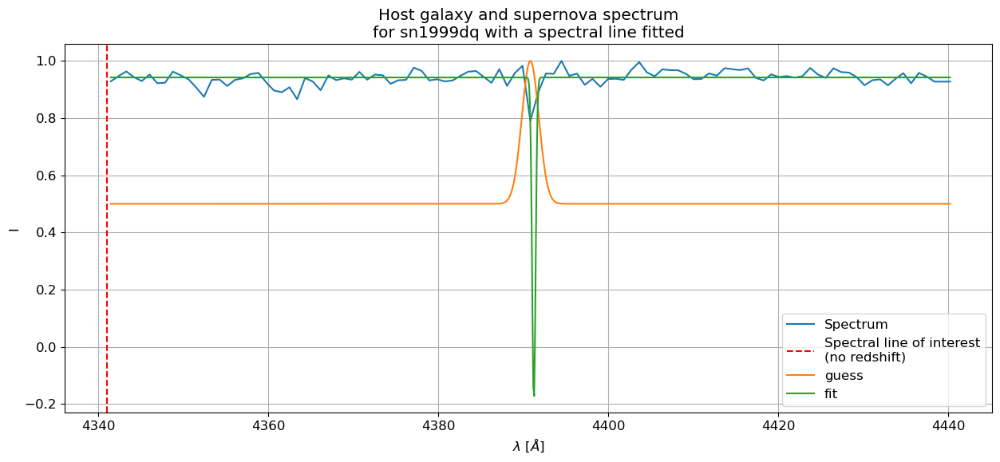

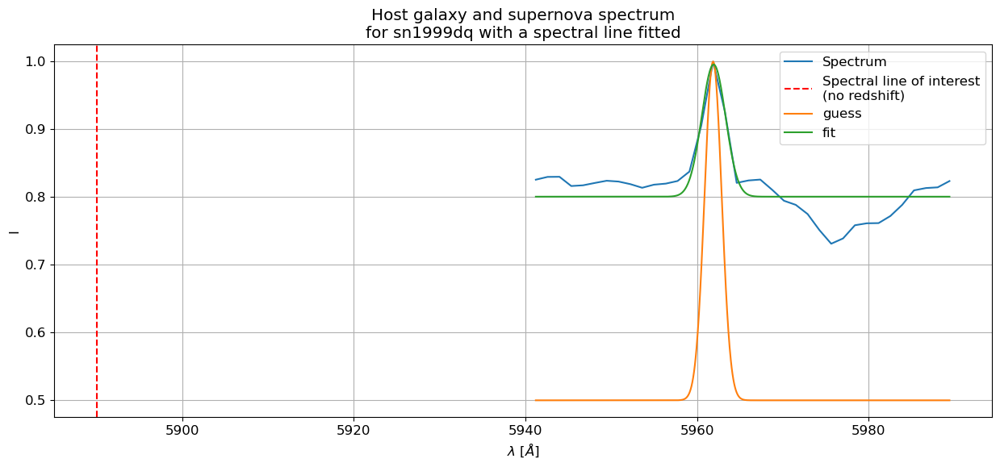

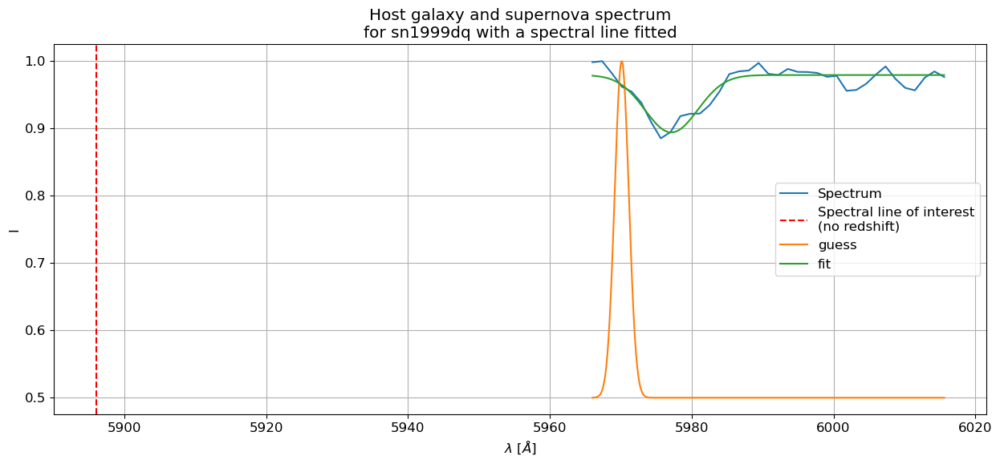

In [15]:
# Fit extra lines for sn1999dq
#plt.figure(figsize=(15,6))
#fit_line_red_plotting(sn1999dq_spec[0], sn1999dq_spec[1], CaIIa, 'sn1999dq', end=50, centre=3990)
# This line gives z = 0.005(1), very different from the z found for other lines so likely inacurrate, ignore it

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn1999dq_spec[0], sn1999dq_spec[1], Hgamma, 'sn1999dq', end=100, centre=4390)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn1999dq_spec[0], sn1999dq_spec[1], NaIa, 'sn1999dq', start=50, end=100)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn1999dq_spec[0], sn1999dq_spec[1], NaIb, 'sn1999dq', start=70, end=120, centre=5970)

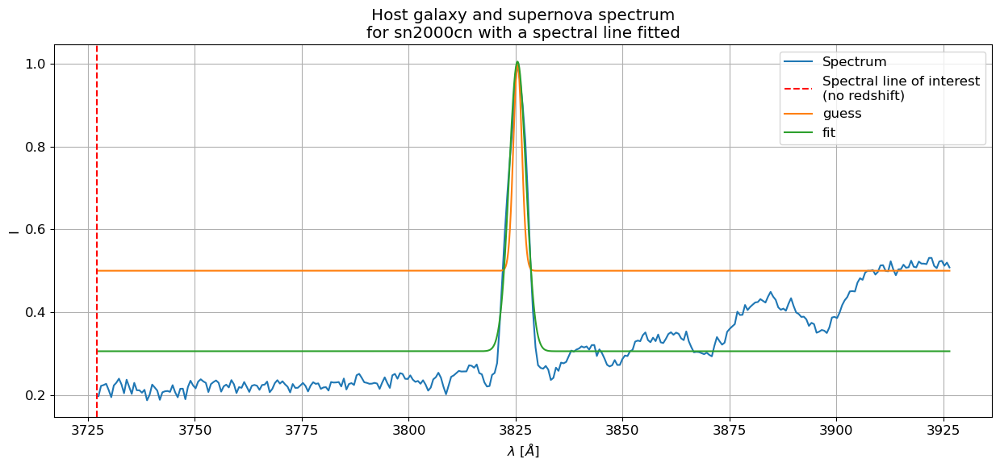

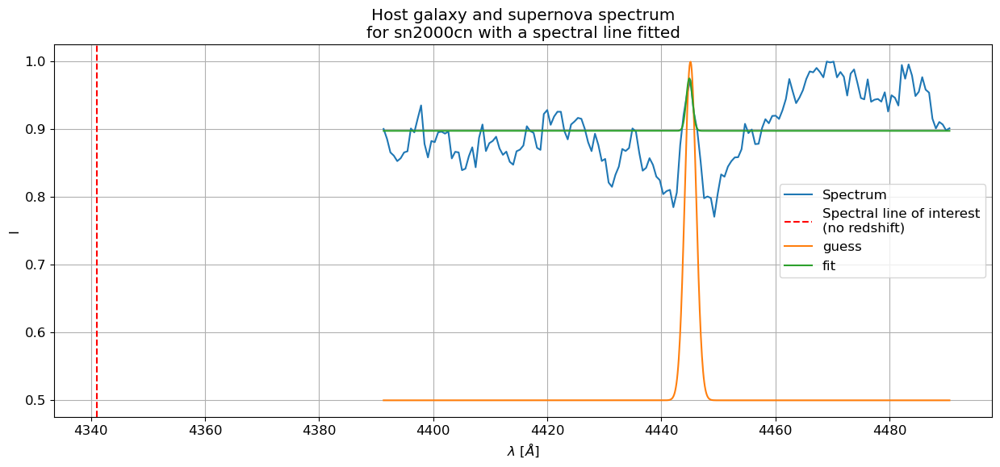

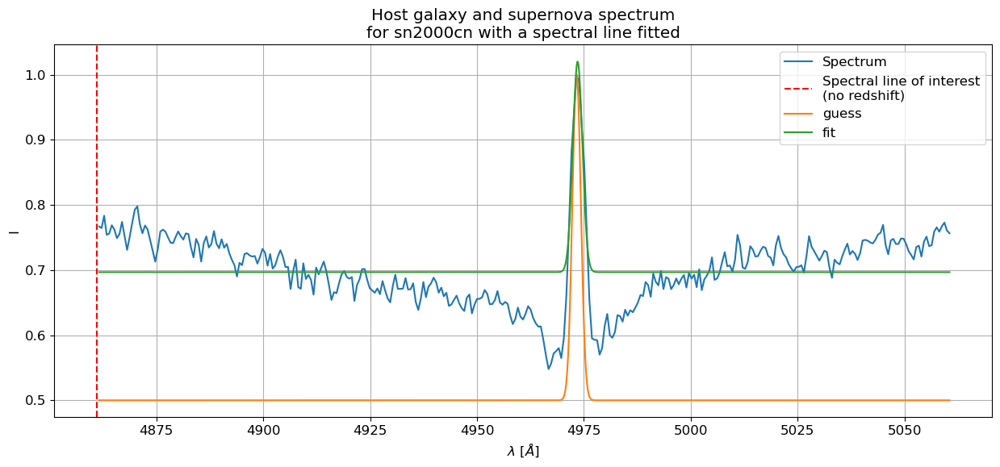

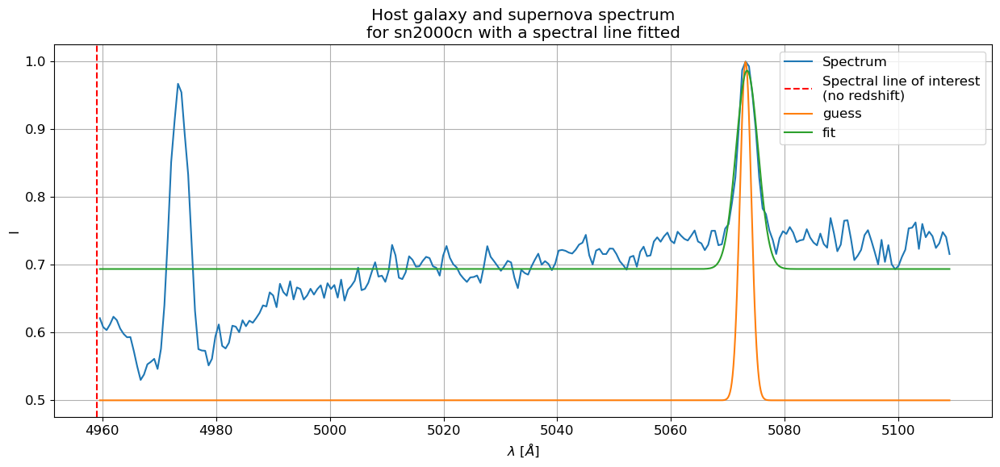

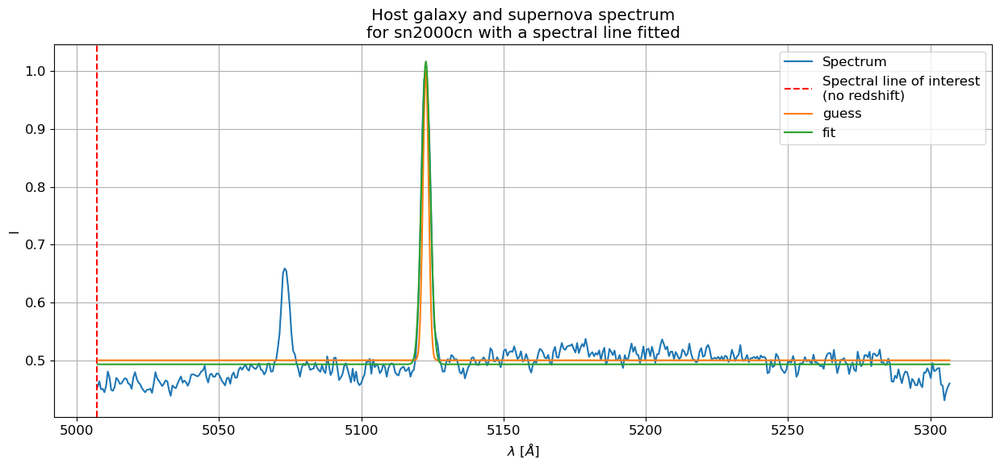

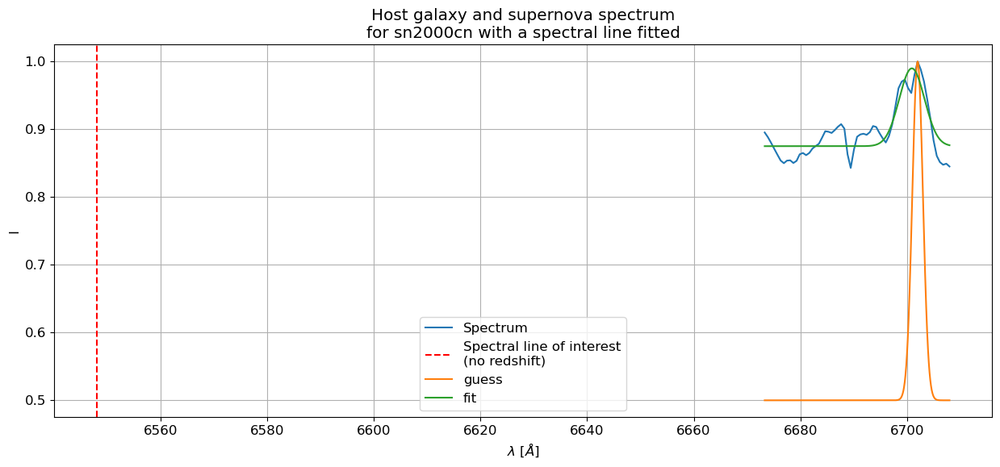

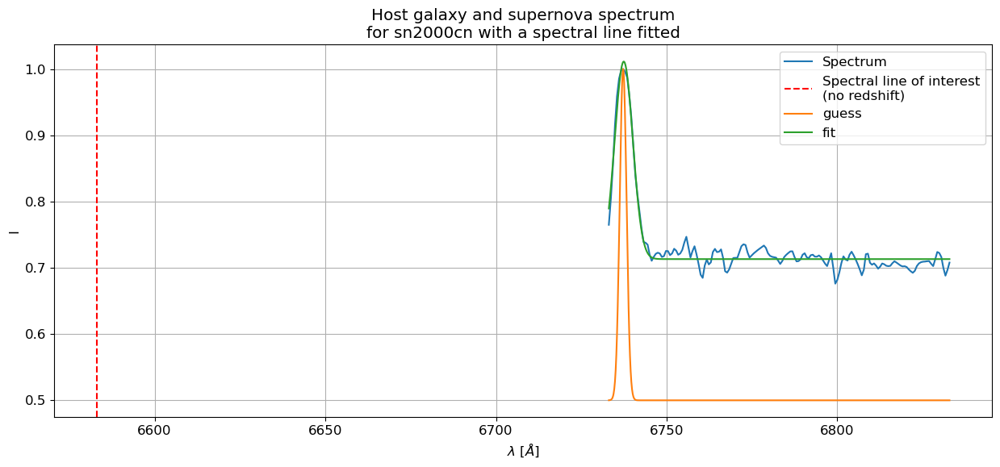

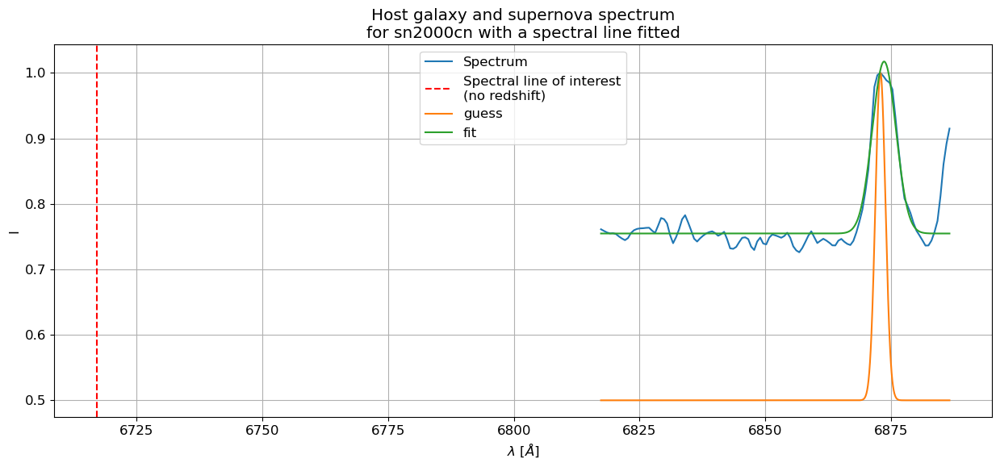

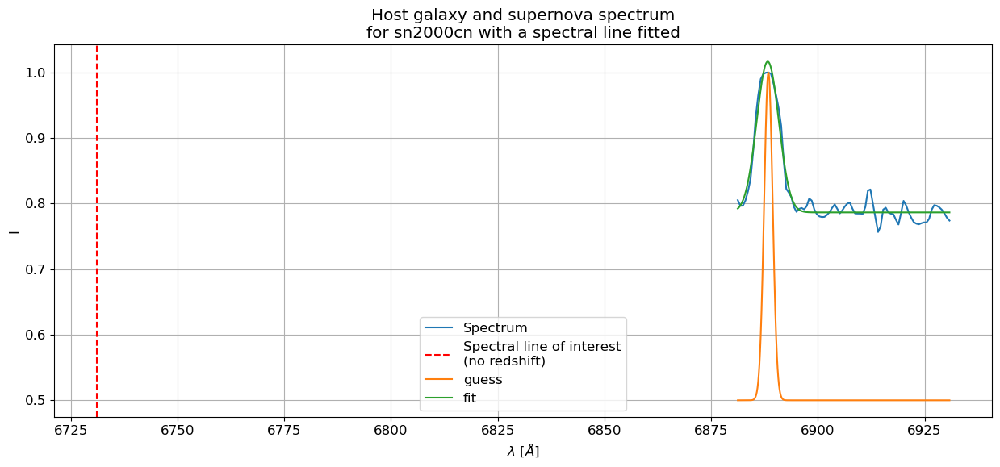

In [16]:
# Fit extra lines for sn2000cn
plt.figure(figsize=(15,6))
fit_line_red_plotting(sn2000cn_spec[0], sn2000cn_spec[1], OII, 'sn2000cn', end=200)

#plt.figure(figsize=(15,6))
#fit_line_red_plotting(sn2000cn_spec[0], sn2000cn_spec[1], CaIIa, 'sn2000cn', start=50, end=100, centre=4035)

#plt.figure(figsize=(15,6))
#fit_line_red_plotting(sn2000cn_spec[0], sn2000cn_spec[1], CaIIb, 'sn2000cn', start=120, end=180, centre=4070)
# Both of these lines give very different values of z from the norm so likely what is being fit is not the lines

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn2000cn_spec[0], sn2000cn_spec[1], Hgamma, 'sn2000cn', start=50, end=150, centre=4445)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn2000cn_spec[0], sn2000cn_spec[1], Hbeta, 'sn2000cn', end=200)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn2000cn_spec[0], sn2000cn_spec[1], OIIIa, 'sn2000cn', end=150)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn2000cn_spec[0], sn2000cn_spec[1], OIIIb, 'sn2000cn', end=300)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn2000cn_spec[0], sn2000cn_spec[1], NIIa, 'sn2000cn', start=125, end=160)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn2000cn_spec[0], sn2000cn_spec[1], NIIb, 'sn2000cn', start=150, end=250)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn2000cn_spec[0], sn2000cn_spec[1], SIIa, 'sn2000cn', start=100, end=170)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn2000cn_spec[0], sn2000cn_spec[1], SIIb, 'sn2000cn', start=150, end=200)

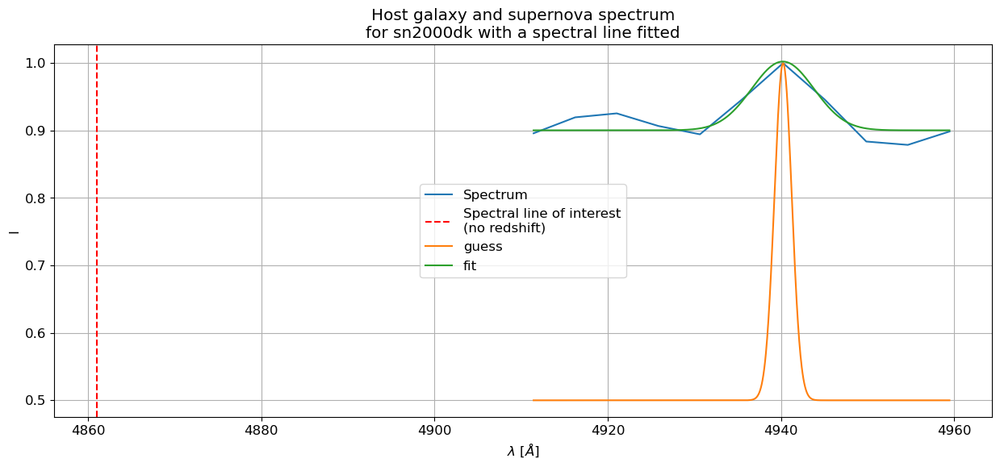

In [17]:
# Fit extra line for sn2000dk

#plt.figure(figsize=(15,6))
#fit_line_red_plotting(sn2000dk_spec[0], sn2000dk_spec[1], NIIb, 'sn2000dk', start=102, end=200, centre=6700)

plt.figure(figsize=(15,6))
fit_line_red_plotting(sn2000dk_spec[0], sn2000dk_spec[1], Hbeta, 'sn2000dk', start=50, end=100)


In [18]:
# Find the redshift of each galaxy based on all spectral lines which can be fit
z_vals = np.zeros((7,1))
z_vals_unc = np.zeros((7,1))

# Fitting parameters for each spectrum and line
lines = [[Halpha, SIIa],
         [Halpha, OII, Hbeta, OIIIa, OIIIb],
         [Halpha, OIIIb],
         [Halpha, Hbeta, OIIIa, OIIIb],
         [Halpha, Hgamma, NaIa, NaIb],
         [Halpha, OII, Hgamma, Hbeta, OIIIa, OIIIb, NIIa, NIIb, SIIa, SIIb],
         [Halpha, NIIb, Hbeta]]

centres = [[None, None],
           [None, None, 4925, 5020, None],
           [None, 5055],
           [None, 4925, 5020, None],
           [None, 4390, None, 5970],
           [None, None, 4445, None, None, None, None, None, None, None],
           [None, 6700, None]]

starts = [[0, 20],
          [0, 0, 40, 40, 30],
          [0, 0],
          [0, 40, 40, 30],
          [0, 0, 50, 70],
          [0, 0, 50, 0, 0, 0, 125, 150, 100, 150],
          [0, 102, 50]]

ends = [[100, 150],
        [200, 100, 100, 100, 100],
        [100, 100],
        [150, 100, 100, 100],
        [150, 100, 100, 120],
        [200, 200, 150, 200, 150, 300, 160, 250, 170, 200],
        [200, 200, 100]]



for i in range(len(sne_wl)):
    # Store the various z values for each spectrum
    z_temp = np.array([])
    z_temp_unc = np.array([])

    # Loop over each line of interest for each spectrum
    for j in range(len(lines[i])):
        red_shift, red_shift_unc = find_redshift(sne_wl[i], sne_intensity[i], lines[i][j], centre=centres[i][j], start=starts[i][j], end=ends[i][j])
        
        z_temp = np.append(z_temp, red_shift)
        z_temp = np.append(z_temp, red_shift + red_shift_unc)
        z_temp = np.append(z_temp, red_shift - red_shift_unc)

    # Find mean value and standard deviation and add to array
    z_vals[i] = np.mean(z_temp)
    z_vals_unc[i] = np.std(z_temp) / np.sqrt(len(z_temp))


z_vals = z_vals.reshape((1,7))[0]
z_vals_unc = z_vals_unc.reshape((1,7))[0]

z_vals_rounded, z_vals_unc_rounded = round_sig_fig_uncertainty(z_vals, z_vals_unc)

# Print
print('When fitting all appropriate lines for each spectrum:')
for i in range(len(z_vals)):
    print(f'\tThe red shift of {names[i]} is {z_vals_rounded[i]} \u00B1 {z_vals_unc_rounded[i]}')

When fitting all appropriate lines for each spectrum:
	The red shift of SN1997bp is 0.009 ± 0.001
	The red shift of SN1997E is 0.0129 ± 0.0002
	The red shift of SN1998es is 0.0096 ± 0.0003
	The red shift of SN1999aa is 0.01301 ± 0.00013
	The red shift of SN1999dq is 0.0129 ± 0.0004
	The red shift of SN2000cn is 0.0236 ± 0.0002
	The red shift of SN2000dk is 0.0167 ± 0.0006


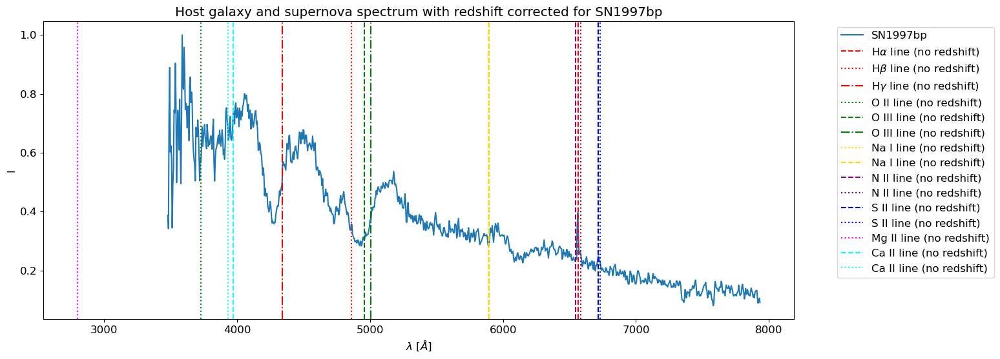

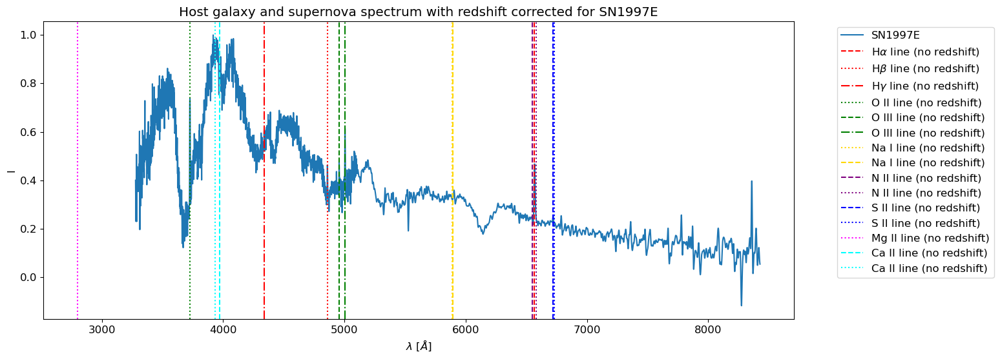

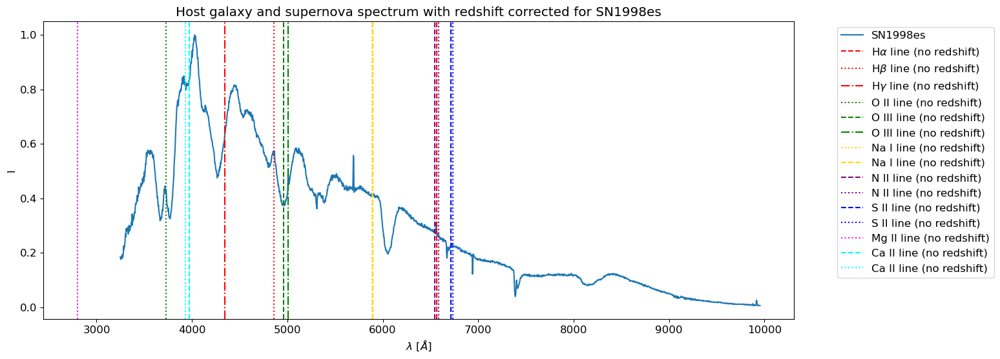

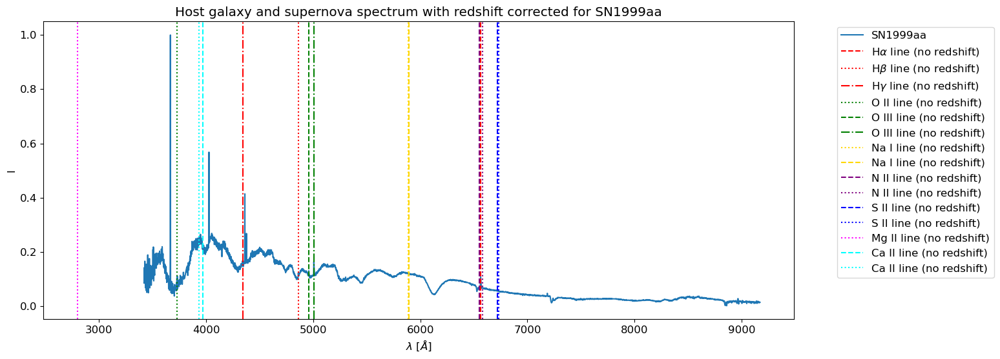

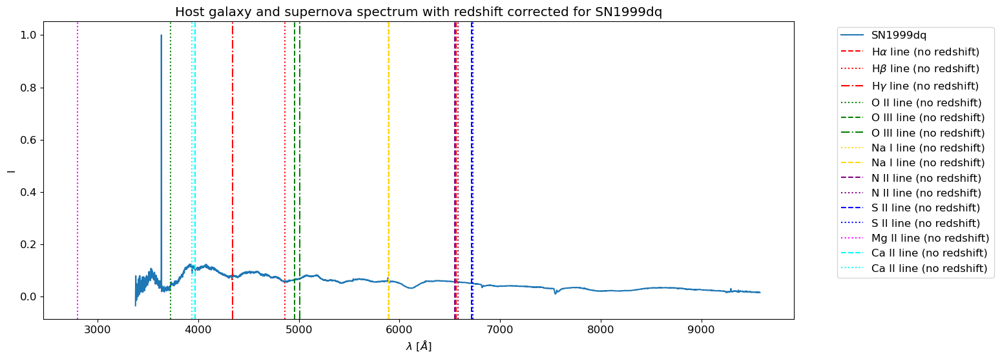

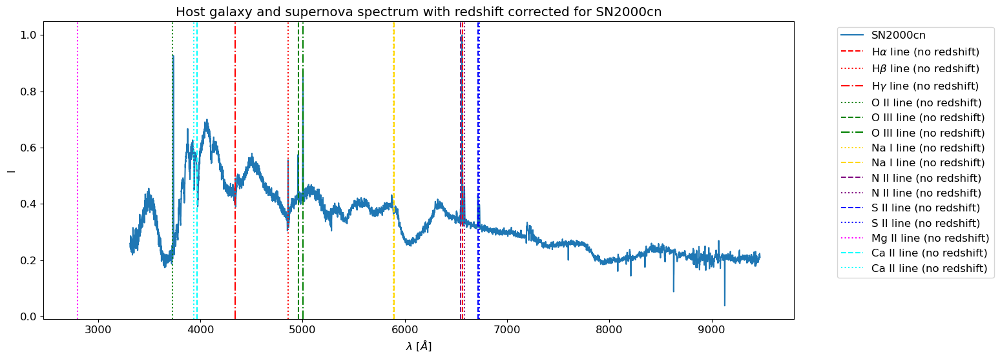

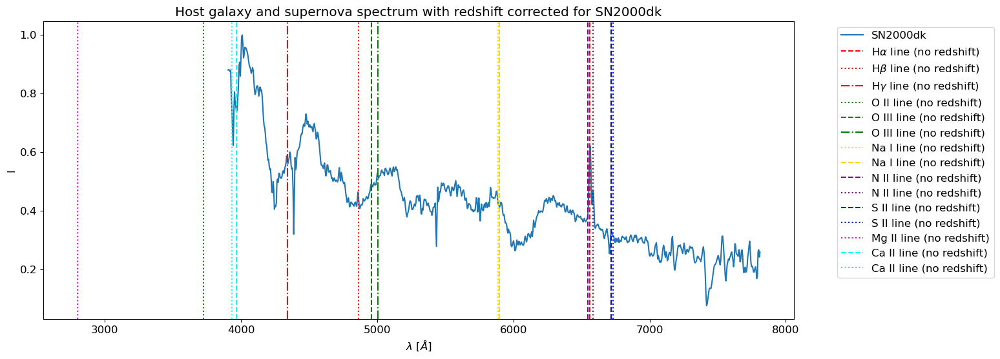

In [19]:
# Plot the spectra corrected
sne_wl_corrected = sne_wl / (1 + z_vals)

for i in range(len(sne_wl_corrected)):
    plt.figure(figsize=(15,6))

    plt.plot(sne_wl_corrected[i], sne_intensity[i], label=names[i])
    plt.title(f'Host galaxy and supernova spectrum with redshift corrected for {names[i]}')
    plt.xlabel(r'$\lambda$ [$\AA$]')
    plt.ylabel('I')

    plt.axvline(Halpha, c='red', ls='--', label=r'H$\alpha$ line (no redshift)')
    plt.axvline(Hbeta, c='red', ls=':', label=r'H$\beta$ line (no redshift)')
    plt.axvline(Hgamma, c='red', ls='-.', label=r'H$\gamma$ line (no redshift)')

    plt.axvline(OII, c='green', ls=':', label=r'O II line (no redshift)')
    plt.axvline(OIIIa, c='green', ls='--', label=r'O III line (no redshift)')
    plt.axvline(OIIIb, c='green', ls='-.', label=r'O III line (no redshift)')

    plt.axvline(NaIa, c='gold', ls=':', label=r'Na I line (no redshift)')
    plt.axvline(NaIb, c='gold', ls='--', label=r'Na I line (no redshift)')

    plt.axvline(NIIa, c='purple', ls='--', label=r'N II line (no redshift)')
    plt.axvline(NIIb, c='purple', ls=':', label=r'N II line (no redshift)')

    plt.axvline(SIIa, c='blue', ls='--', label=r'S II line (no redshift)')
    plt.axvline(SIIb, c='blue', ls=':', label=r'S II line (no redshift)')

    plt.axvline(MgII, c='magenta', ls=':', label=r'Mg II line (no redshift)')

    plt.axvline(CaIIa, c='cyan', ls='--', label=r'Ca II line (no redshift)')
    plt.axvline(CaIIb, c='cyan', ls=':', label=r'Ca II line (no redshift)')

    plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
    
    if names[i] == 'sn1999aa' or names[i] == 'sn1999dq':
        plt.ylim([0, 0.4])

        plt.show()

# Part B

In [20]:
# Import the light curve data 
sn1997bp_lc = np.loadtxt('SN_lightcurves/sn1997bp_UBVRI.dat', unpack=True)
sn1997E_lc = np.loadtxt('SN_lightcurves/sn1997E_UBVRI.dat', unpack=True)
sn1998es_lc = np.loadtxt('SN_lightcurves/sn1998es_UBVRI.dat', unpack=True)
sn1999aa_lc = np.loadtxt('SN_lightcurves/sn1999aa_UBVRI.dat', unpack=True)
sn1999dq_lc = np.loadtxt('SN_lightcurves/sn1999dq_UBVRI.dat', unpack=True)
sn2000cn_lc = np.loadtxt('SN_lightcurves/sn2000cn_UBVRI.dat', unpack=True)
sn2000dk_lc = np.loadtxt('SN_lightcurves/sn2000dk_UBVRI.dat', unpack=True)

# Get time data
time = np.array([sn1997bp_lc[0], sn1997E_lc[0], sn1998es_lc[0], sn1999aa_lc[0], sn1999dq_lc[0], sn2000cn_lc[0], sn2000dk_lc[0]], dtype=object)

# Set times to start at 0
for i in range(len(time)):
    time[i] = time[i] - np.amin(time[i])

# Get B band magnitudes and uncertainty
B_band = [sn1997bp_lc[3], sn1997E_lc[3], sn1998es_lc[3], sn1999aa_lc[3], sn1999dq_lc[3], sn2000cn_lc[3], sn2000dk_lc[3]]
B_band_unc = [sn1997bp_lc[4], sn1997E_lc[4], sn1998es_lc[4], sn1999aa_lc[4], sn1999dq_lc[4], sn2000cn_lc[4], sn2000dk_lc[4]]

# Delete anything that has a B value of 99.999
for i in range(len(B_band)):
    index = np.argwhere(B_band[i] == 99.999)
    B_band[i] = np.delete(B_band[i], index)
    time[i] = np.delete(time[i], index)
    B_band_unc[i] = np.delete(B_band_unc[i], index)

# Correct for time dilation
time_corrected = time / (1+z_vals)

# Get uncertainty in corrected time
time_corrected_unc = time / (1+z_vals)**2 * z_vals_unc**2

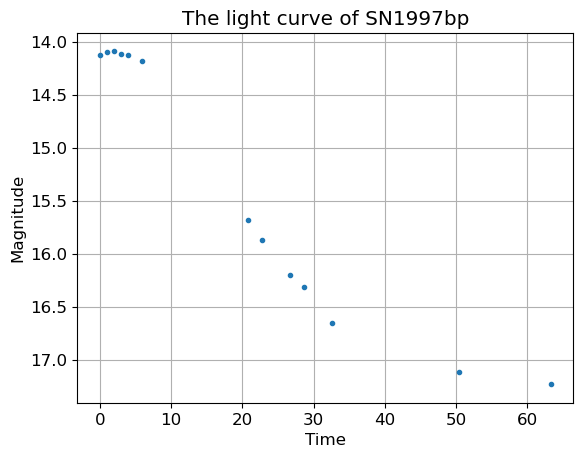

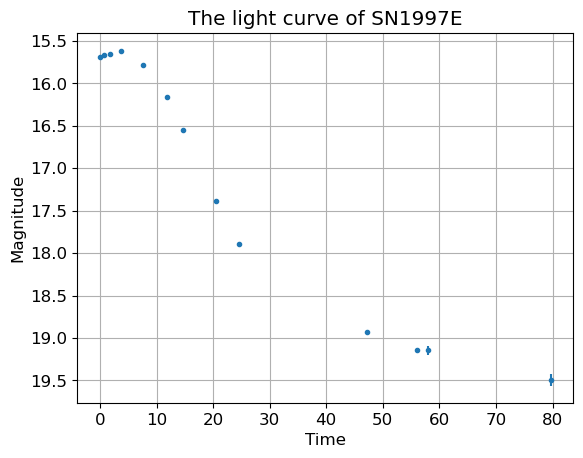

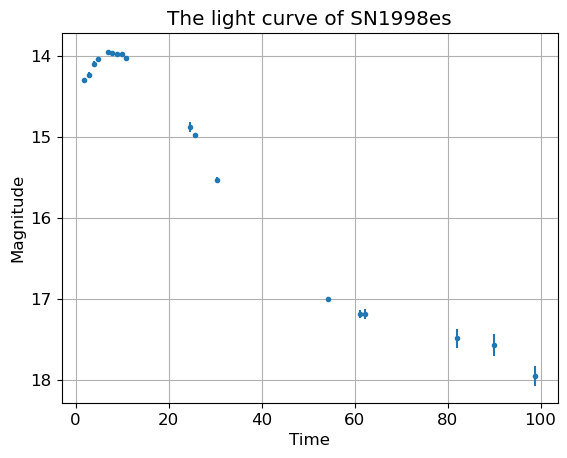

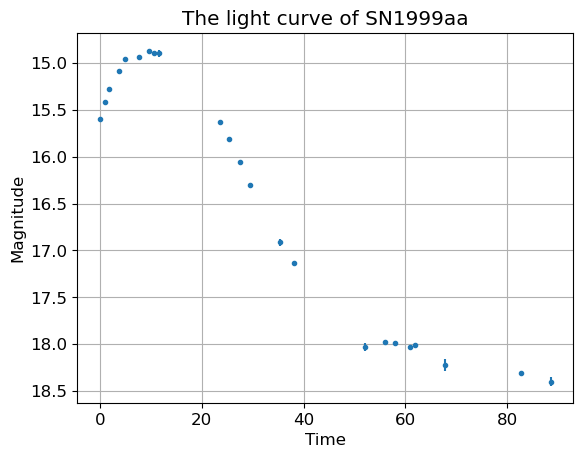

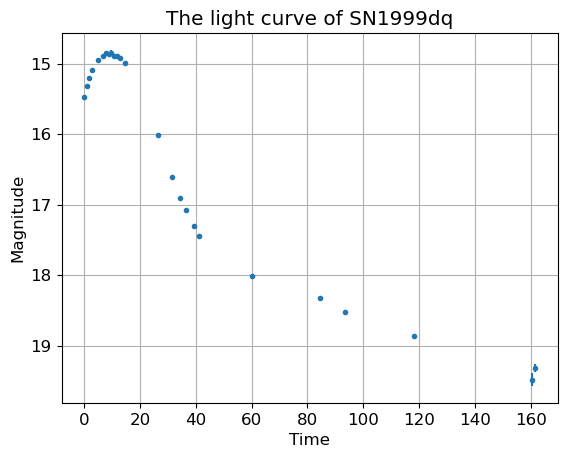

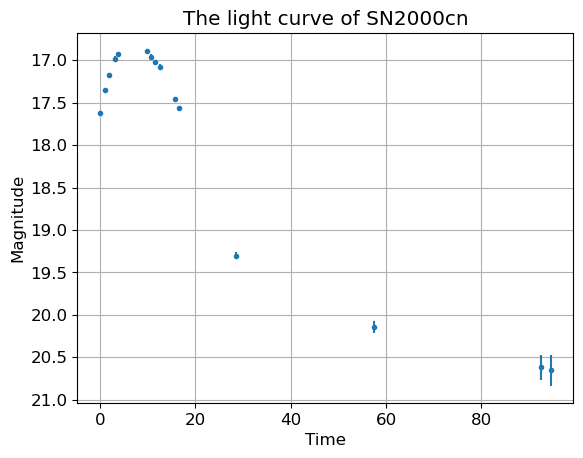

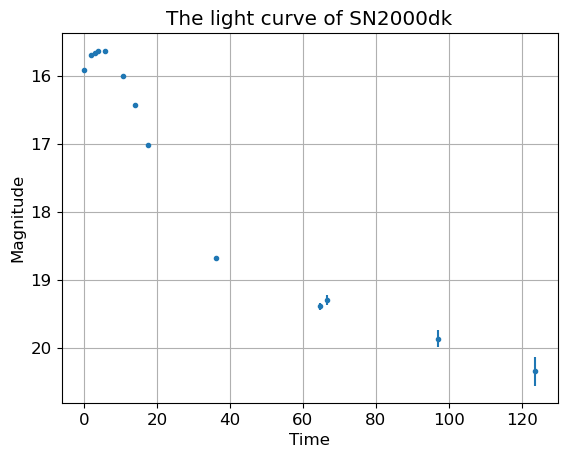

In [21]:
# Plot all light curves

for i in range(len(time)):
    plt.errorbar(time_corrected[i], B_band[i], B_band_unc[i], time_corrected_unc[i], fmt='.')
    plt.gca().invert_yaxis()
    plt.title(f'The light curve of {names[i]}')
    plt.ylabel('Magnitude')
    plt.xlabel('Time')
    plt.grid()
    plt.show()

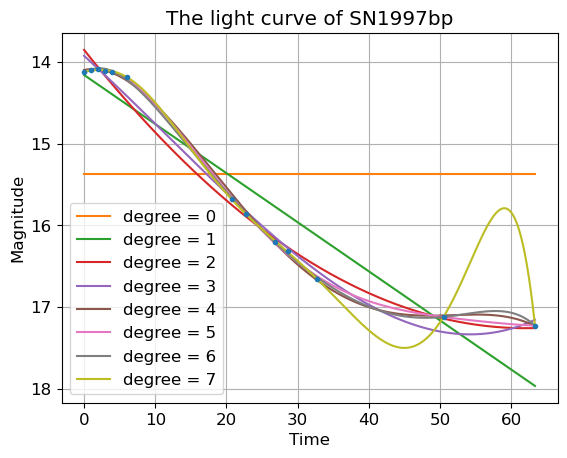

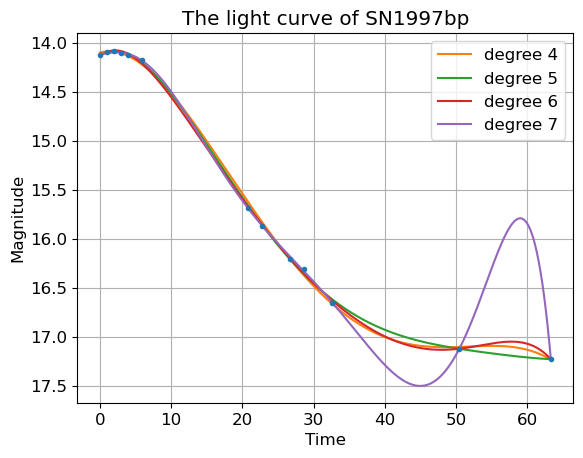

In [22]:
# Fit polynomials of various degrees to the first lightcurve
plt.errorbar(time_corrected[0], B_band[0], B_band_unc[0], time_corrected_unc[0], fmt='.')
plt.gca().invert_yaxis()
plt.title(f'The light curve of {names[0]}')
plt.ylabel('Magnitude')
plt.xlabel('Time')

t = np.linspace(np.amin(time_corrected[0]), np.amax(time_corrected[0]), 1000)

for i in range(8):
    fit = np.polyfit(time_corrected[0], B_band[0], i)
    fit_curve = np.poly1d(fit)
    plt.plot(t, fit_curve(t), label=f'degree = {i}')

plt.legend()
plt.grid()
plt.show()

# Check which degree polynomial to use, 4, 5, 6, 7
plt.errorbar(time_corrected[0], B_band[0], B_band_unc[0], time_corrected_unc[0], fmt='.')
plt.gca().invert_yaxis()
plt.title(f'The light curve of {names[0]}')
plt.ylabel('Magnitude')
plt.xlabel('Time')


for i in range(4, 8):
# Fit the data
    fit = np.polyfit(time_corrected[0], B_band[0], i)
    fit_curve = np.poly1d(fit)

    # Plot
    plt.plot(t, fit_curve(t), label=f'degree {i}')

plt.legend()
plt.grid()
plt.show()

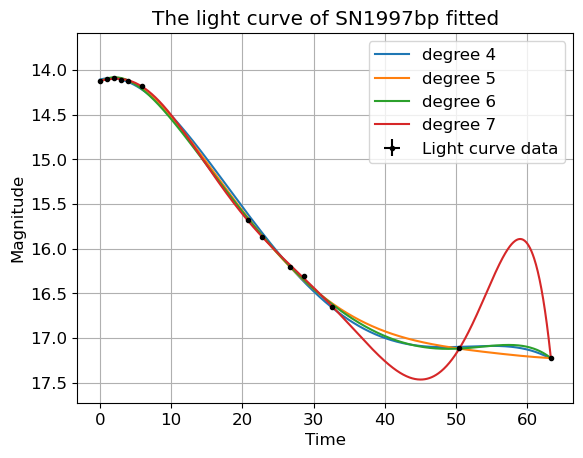

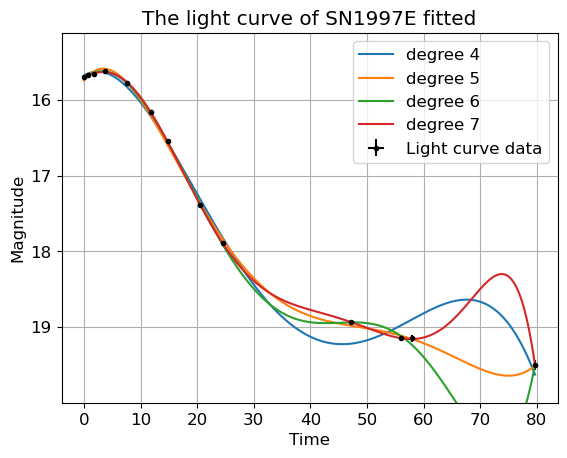

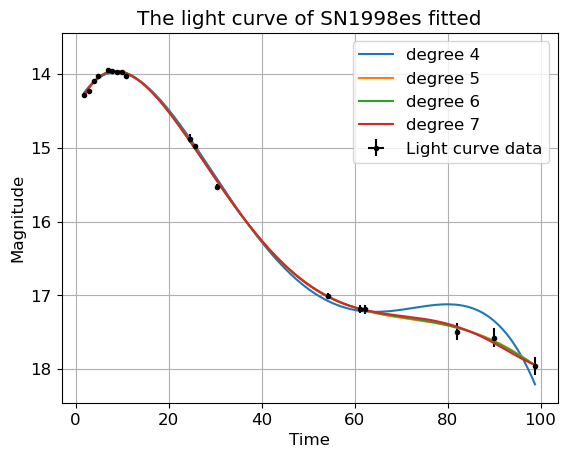

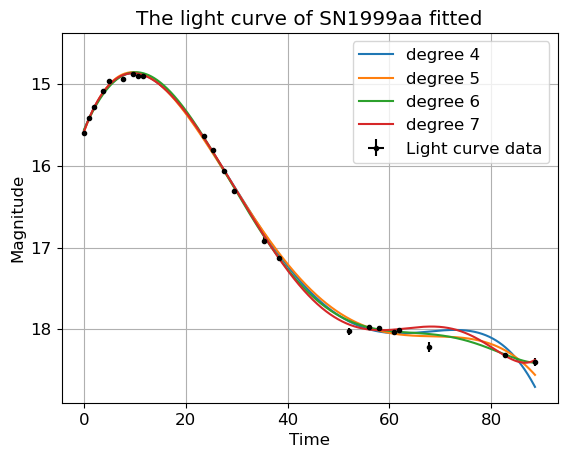

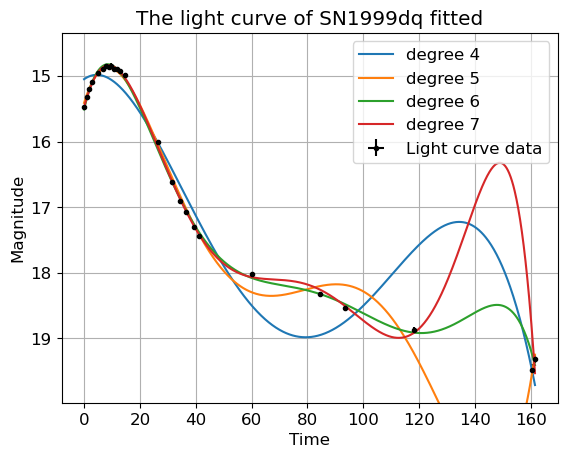

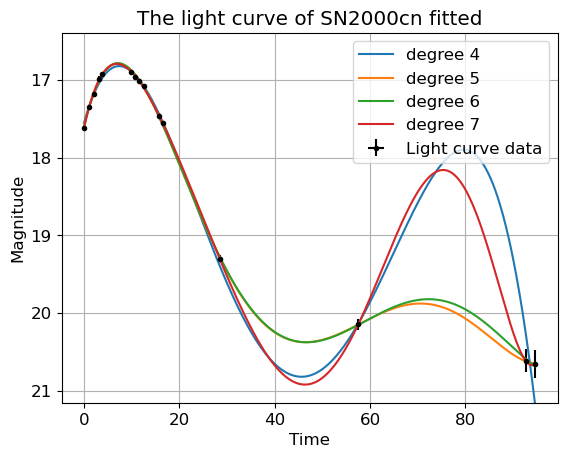

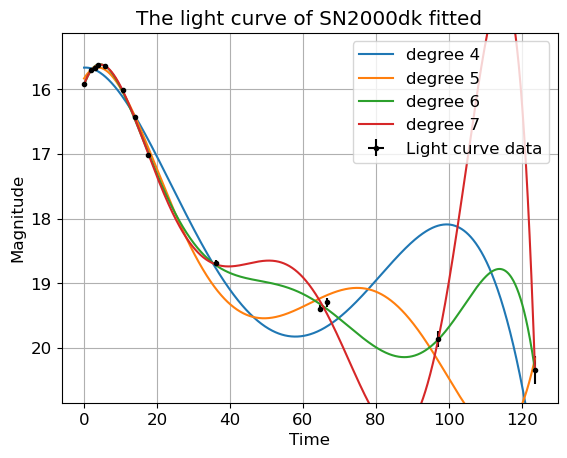

In [23]:
# Plot all light curves with fits of degree 4, 5, 6, 7

for i in range(len(time)):
    t = np.linspace(np.amin(time_corrected[i]), np.amax(time_corrected[i]), 1000)

    # Plot data
    plt.errorbar(time_corrected[i], B_band[i], B_band_unc[i], time_corrected_unc[i], fmt='.', color='black', label='Light curve data')
    plt.gca().invert_yaxis()
    plt.title(f'The light curve of {names[i]} fitted')
    plt.ylabel('Magnitude')
    plt.xlabel('Time')
    
    # Plot fit
    for j in range(4, 8):
        fit, cov = np.polyfit(time_corrected[i], B_band[i], j, cov=True, w=1/B_band_unc[i])
        fit_curve = np.poly1d(fit)
        plt.plot(t, fit_curve(t), label=f'degree {j}')
        fit_curve = np.poly1d(fit+np.sqrt(np.diag(cov)))
    
    plt.ylim([np.amax(B_band[i]) + 0.5, np.amin(B_band[i]) - 0.5])
    plt.legend(loc=1)
    plt.grid()
    plt.show()

Doesn't quite fit all the way, but does in the relevant areas (up to 15 days after peak)

Degree 4 is fairly bad, so ignore that and only use 5, 6, 7

The peak occurs at t = 4.341215931278087, with magnitude 15.611287688465168 ± 0.03735393901602006
The magnitude difference after 15 days is -1.6098929605338768 ± 0.07649093937698795


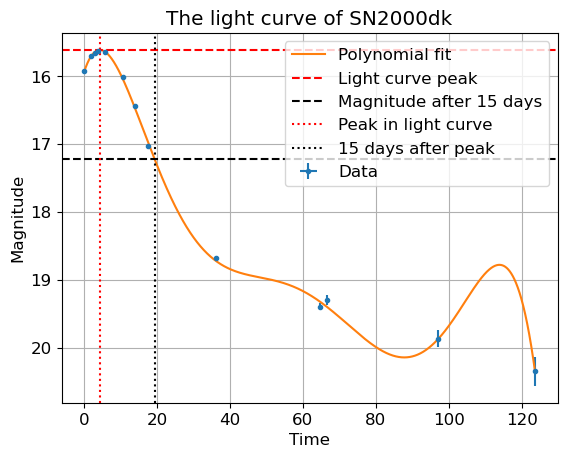

In [24]:
# Last light curve - finding values 15 days after the peak for degree 6 polynomial - no function
plt.errorbar(time_corrected[-1], B_band[-1], B_band_unc[-1], time_corrected_unc[-1], fmt='.', label='Data')
plt.gca().invert_yaxis()
plt.title(f'The light curve of {names[-1]}')
plt.ylabel('Magnitude')
plt.xlabel('Time')

# Array of time values for plotting purposes
t = np.linspace(np.amin(time_corrected[-1]), np.amax(time_corrected[-1]), 10000)

# Fitting
fit, cov = np.polyfit(time_corrected[-1], B_band[-1], 6, cov=True, w=1/B_band_unc[-1])
p_unc = np.sqrt(np.diag(cov))
fit_curve = np.poly1d(fit)

# Plot the fit
plt.plot(t, fit_curve(t), label='Polynomial fit')

# Find location of the peak
peak_loc = np.argmin(fit_curve(t))

# Find the peak and the time it occurs
peak = fit_curve(t)[peak_loc]
peak_time = t[peak_loc]

# Find uncertainties in the peak
peak_unc = np.sqrt(p_unc[0]**2*(peak_time)**6 + p_unc[1]**2*(peak_time)**5 + p_unc[2]**2*(peak_time)**4 + p_unc[3]**2*(peak_time)**3 + p_unc[4]**2*(peak_time)**2 + p_unc[5]**2*(peak_time) + p_unc[6]**2)

# Find magnitude after 15 days and the uncertainty in this
m15 = np.polyval(fit, peak_time + 15)
m15_unc = np.sqrt(p_unc[0]**2*(peak_time + 15)**6 + p_unc[1]**2*(peak_time + 15)**5 + p_unc[2]**2*(peak_time + 15)**4 + p_unc[3]**2*(peak_time + 15)**3 + p_unc[4]**2*(peak_time + 15)**2 + p_unc[5]**2*(peak_time + 15) + p_unc[6]**2)

# Outputs
print(f'The peak occurs at t = {peak_time}, with magnitude {peak} \u00B1 {peak_unc}')
print(f'The magnitude difference after 15 days is {peak - m15} \u00B1 {np.sqrt(peak_unc**2 + m15_unc**2)}')

plt.axhline(peak, color='red', ls='--', label='Light curve peak')
plt.axhline(m15, color='black', ls='--', label='Magnitude after 15 days')

plt.axvline(peak_time, color='red', ls=':', label='Peak in light curve')
plt.axvline(peak_time+15, color='black', ls=':', label='15 days after peak')

plt.grid()
plt.legend()

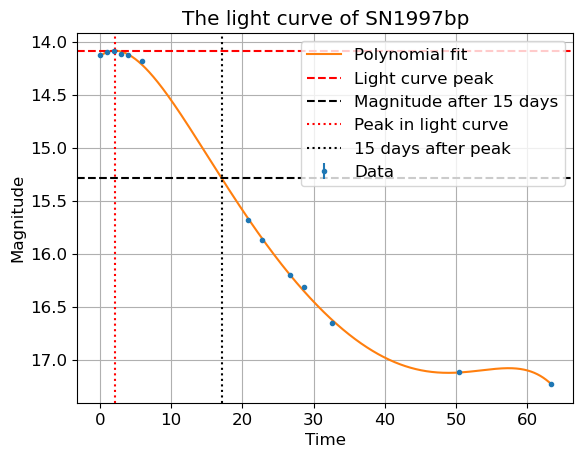

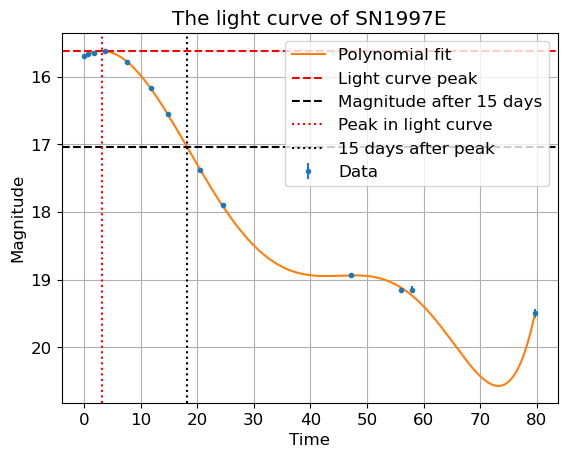

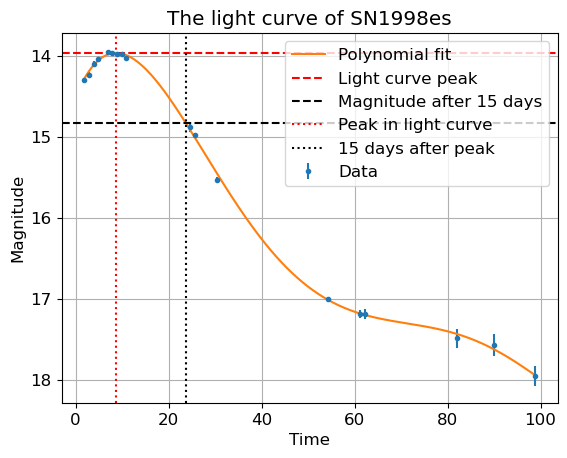

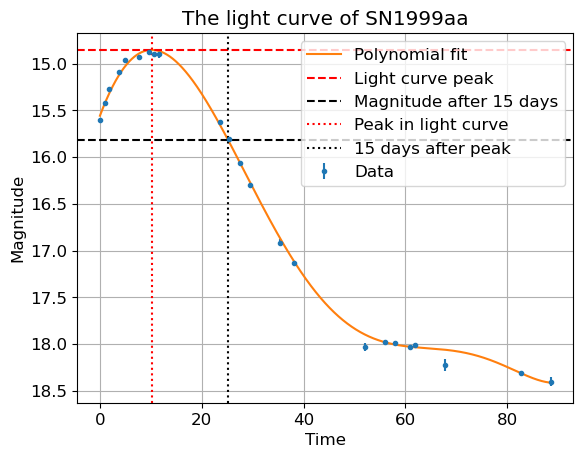

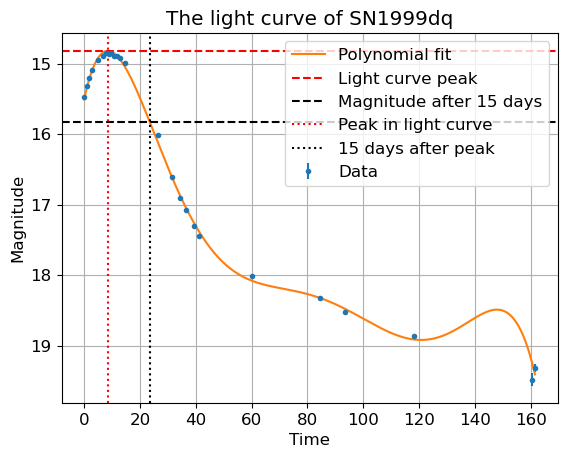

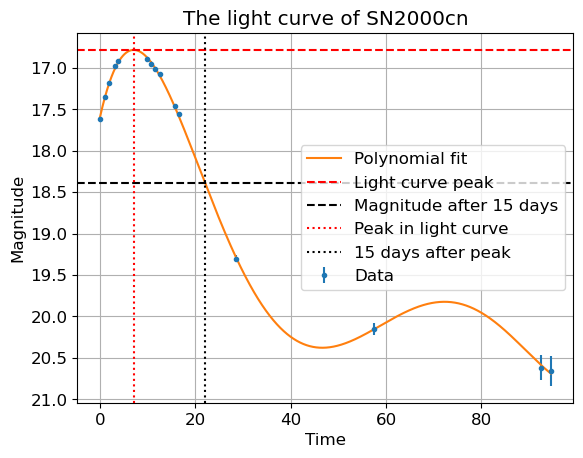

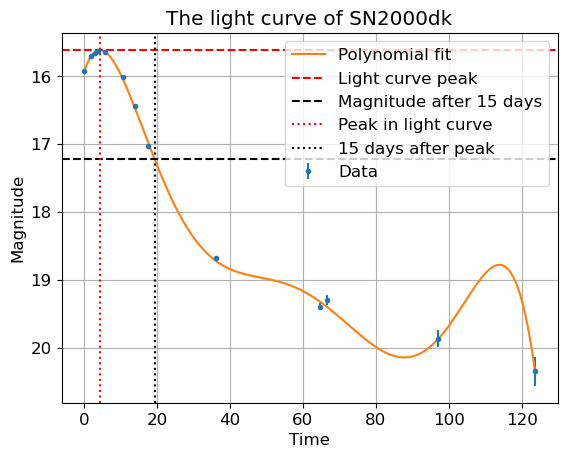

In [25]:
# Plot all light curves with the relevant points marked for degree 6 polynomials
for i in range(len(time_corrected)):
    deltaBm15_plotting(time_corrected[i], B_band[i], B_band_unc[i], 6, names[i])

In [26]:
# Find the values for all light curves - use different degree polynomials
peaks = np.array([])
DBm15 = np.array([])
peaks_unc = np.array([])
DBm15_unc = np.array([])


for i in range(len(time)):
    # Temporarily store the peak and difference after 15 days
    p_temp = np.array([])
    m_temp = np.array([])
    p_unc_temp = np.array([])
    m_unc_temp = np.array([])

    # Fit for all and each degree
    for deg in range(5, 8):
        p, m , p_unc, m_unc = deltaBm15(time_corrected[i], B_band[i], B_band_unc[i], deg)
        
        p_temp = np.append(p_temp, p)
        p_temp = np.append(p_temp, p + p_unc)
        p_temp = np.append(p_temp, p - p_unc)
        m_temp = np.append(m_temp, m)
        m_temp = np.append(m_temp, m + m_unc)
        m_temp = np.append(m_temp, m - m_unc)

    # Take the mean of this and standard deviation
    peaks = np.append(peaks, np.mean(p_temp))
    DBm15 = np.append(DBm15, np.mean(m_temp))
    peaks_unc = np.append(peaks_unc, np.std(p_temp) / np.sqrt(len(p_temp)))
    DBm15_unc = np.append(DBm15_unc, np.std(m_temp) / np.sqrt(len(m_temp)))

    peak_rounded, peak_unc_rounded = round_sig_fig_uncertainty(peaks[-1], peaks_unc[-1])
    DBm15_rounded, DBm15_unc_rounded = round_sig_fig_uncertainty(DBm15[-1], DBm15_unc[-1])
    
    print(f'For {names[i]} the light curve peak is at {peak_rounded} \u00B1 {peak_unc_rounded} magnitudes, and the difference after 15 days is {DBm15_rounded} \u00B1 {DBm15_unc_rounded} magnitudes')


For SN1997bp the light curve peak is at 14.087 ± 0.009 magnitudes, and the difference after 15 days is 1.2 ± 0.03 magnitudes
For SN1997E the light curve peak is at 15.614 ± 0.01 magnitudes, and the difference after 15 days is 1.45 ± 0.02 magnitudes
For SN1998es the light curve peak is at 13.96 ± 0.02 magnitudes, and the difference after 15 days is 0.86 ± 0.04 magnitudes
For SN1999aa the light curve peak is at 14.859 ± 0.015 magnitudes, and the difference after 15 days is 0.93 ± 0.03 magnitudes
For SN1999dq the light curve peak is at 14.842 ± 0.018 magnitudes, and the difference after 15 days is 0.96 ± 0.03 magnitudes
For SN2000cn the light curve peak is at 16.79 ± 0.01 magnitudes, and the difference after 15 days is 1.58 ± 0.03 magnitudes
For SN2000dk the light curve peak is at 15.63 ± 0.018 magnitudes, and the difference after 15 days is 1.56 ± 0.05 magnitudes


# Part C

In [27]:
# Find the distance moduli for each galaxy
# Using the preferred model in Part D
model = cosmo.FlatLambdaCDM(H0=70, Om0=0.3)

mu = model.distmod(z_vals).value

# Upper and lower bounds of mu are given by adding/subtracting the uncertainty in z to/from z to get upper/lower bounds of z
mu_upper = model.distmod(z_vals + z_vals_unc).value
mu_lower = model.distmod(z_vals - z_vals_unc).value

# The uncertainty is found by taking the difference between the actual values of mu and the upper/lower bounds
mu_unc_lower = np.abs(mu - mu_lower)
mu_unc_upper = np.abs(mu - mu_upper)

# Absolute magnitude from definition of the distance modulus
abs_mag = peaks - mu

# Propagate uncertainties as usual
abs_mag_unc_lower = np.sqrt(peaks_unc**2 + mu_unc_lower**2)
abs_mag_unc_upper = np.sqrt(peaks_unc**2 + mu_unc_upper**2)

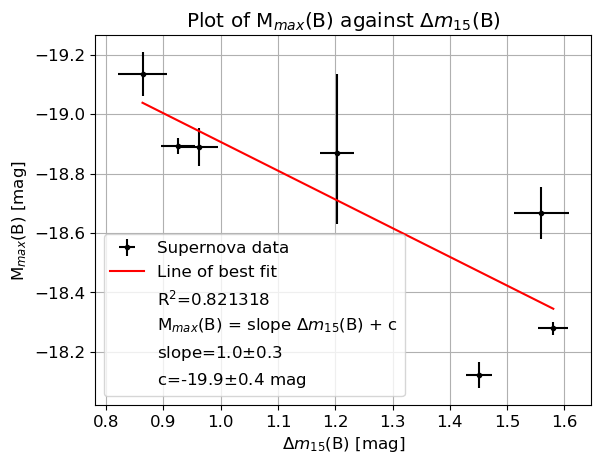

In [28]:
# Plot without correction to max B

# Find the best fit line
fit_partC = stats.linregress(DBm15, abs_mag)

slope, slope_err = round_sig_fig_uncertainty(fit_partC.slope, fit_partC.stderr)
intercept, intercept_err = round_sig_fig_uncertainty(fit_partC.intercept, fit_partC.intercept_stderr)

# x value array
x = np.array([np.amin(DBm15), np.amax(DBm15)])

plt.gca().invert_yaxis()
plt.errorbar(DBm15, abs_mag, (abs_mag_unc_lower, abs_mag_unc_upper), DBm15_unc, fmt='.', label='Supernova data', color='black')
plt.title(r'Plot of M$_{max}$(B) against $\Delta m_{15}$(B)')
plt.xlabel(r'$\Delta m_{15}$(B) [mag]')
plt.ylabel(r'M$_{max}$(B) [mag]')
plt.grid()
plt.plot(x, fit_partC.slope*x + fit_partC.intercept, label='Line of best fit', color='red')

plt.plot([], [], ' ', label='R$^2$='+str(np.round(fit_partC.rvalue, 6)))
plt.plot([], [], ' ', label=r'M$_{max}$(B) = slope $\Delta m_{15}$(B) + c')
plt.plot([], [], ' ', label='slope='+str(slope)+r'$ \pm $'+str(slope_err))
plt.plot([], [], ' ', label='c='+str(intercept)+r'$ \pm $'+str(intercept_err)+' mag')

handles, labels = plt.gca().get_legend_handles_labels()
order = [5,0,1,2,3,4]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

Text(0.008, 16.1, 'Reduced $\\chi^2=$5.536')

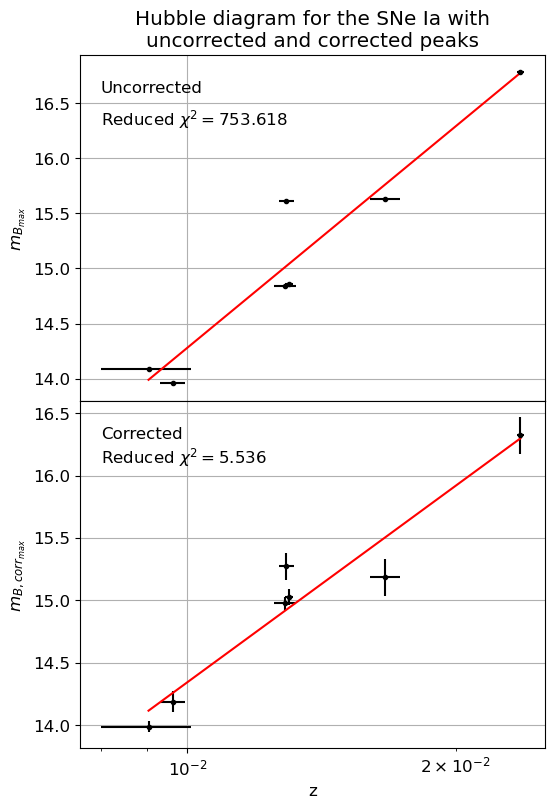

In [29]:
# Plot Hubble diagrams
peaks_corr = peaks - fit_partC.slope * (DBm15 - 1.1)

peaks_corr_unc = np.sqrt(peaks_unc**2 + (DBm15 - 1.1)**2*fit_partC.stderr**2 + fit_partC.slope**2*DBm15_unc**2)


# Fits for both plots
fit_uncorr = stats.linregress(np.log10(z_vals), peaks)
fit_corr = stats.linregress(np.log10(z_vals), peaks_corr)

# Get the expected values for each redshift for each plot
expected_uncorr = fit_uncorr.slope*np.log10(z_vals) + fit_uncorr.intercept
expected_corr = fit_corr.slope*np.log10(z_vals) + fit_corr.intercept

# Find the corresponding chi2 scores
red_chi2_uncorr = chi2(peaks, expected_uncorr, peaks_unc) / (len(peaks) - 2)
red_chi2_corr = chi2(peaks_corr, expected_corr, peaks_corr_unc) / (len(peaks_corr) - 2)

# x value
x = np.array([np.amin(z_vals), np.amax(z_vals)])

# Plot
fig, ax = plt.subplots(2, 1, sharex=True, figsize=(6,9))
fig.subplots_adjust(hspace=0)

ax[0].set_title('Hubble diagram for the SNe Ia with\nuncorrected and corrected peaks')

ax[0].errorbar(z_vals, peaks, peaks_unc, z_vals_unc, fmt='.', color='black')
ax[0].plot(x, fit_uncorr.slope * np.log10(x) + fit_uncorr.intercept, color='red')
ax[0].grid()
ax[0].set_ylabel(r'$m_{B_{max}}$')
ax[0].text(0.8e-2, 16.6, 'Uncorrected')
ax[0].text(0.8e-2, 16.3, fr'Reduced $\chi^2=${np.round(red_chi2_uncorr, 3)}')

ax[1].errorbar(z_vals, peaks_corr, peaks_corr_unc, z_vals_unc, fmt='.', color='black')
ax[1].plot(x, fit_corr.slope * np.log10(x) + fit_corr.intercept, color='red')
ax[1].set_xscale('log')
ax[1].grid()
ax[1].set_xlabel('z')
ax[1].set_ylabel(r'$m_{B, corr_{max}}$')
ax[1].text(0.8e-2, 16.3, 'Corrected')
ax[1].text(0.8e-2, 16.1, fr'Reduced $\chi^2=${np.round(red_chi2_corr, 3)}')

# Part D

In [30]:
# Import the supernova data
data = pd.read_csv('Allsupernovae.csv')

# Split data into different variables
mb = data.mb
mb_err = data.error_mb
x1 = data.X1
x1_err = data.error_X1
c = data.c
c_err = data.error_c

z = np.array(data.zcmb)
gal_mass = data.LogMst
gal_mass_err = data.error_Mst

In [31]:
# Check where galaxy mass >= 10^10 M_sun
ind = gal_mass >= 10

# Coefficients
alpha = 0.141
alpha_err = 0.006
beta = 3.101
beta_err = 0.075
delta_m = -0.07
delta_m_err = 0.02

MB = -19.05 + delta_m*ind


MB_err = np.array([])


for i in range(len(gal_mass)):
    # If the galaxy's mass >= 10, or if its mass + the uncertainty >= 10 include the error in delta m in the calculation of the uncertainty
    if gal_mass[i] >= 10 or (gal_mass[i] + gal_mass_err[i]) >= 10:
        err = np.sqrt(0.02**2 + delta_m_err**2)
        MB_err = np.append(MB_err, err)
    # Otherwise 
    else:
        MB_err = np.append(MB_err, 0.02)

In [32]:
# Define mu
mu = mb - MB + alpha * x1 - beta * c

mu_unc = np.sqrt(mb_err**2 + MB_err**2 + alpha_err**2*x1**2 + x1_err**2*alpha**2 + beta_err**2*c**2 + c_err**2*beta**2)

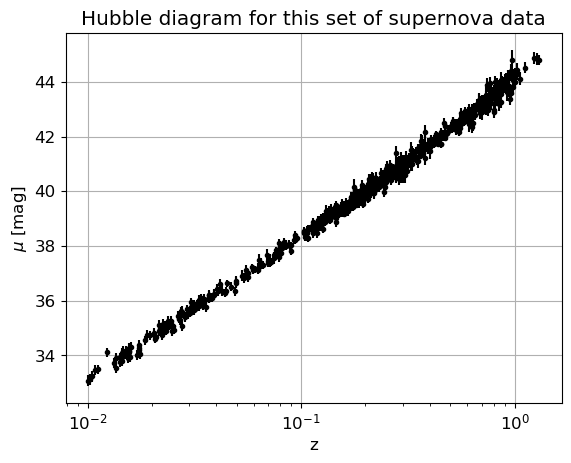

In [33]:
# Hubble diagram
plt.errorbar(z, mu, mu_unc, color='black', fmt='.')
plt.xscale('log')
plt.xlabel('z')
plt.ylabel(r'$\mu$ [mag]')
plt.title('Hubble diagram for this set of supernova data')
plt.grid()

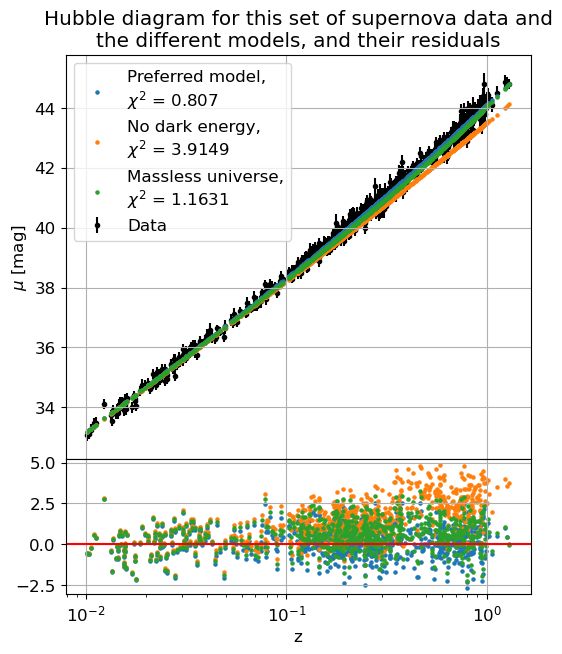

In [34]:
# Moduli for different models
massless_dist = const.c.to(u.km * u.s**-1) * z / (70 * u.km * u.s**-1 * u.Mpc**-1) * (1 + z/2)
mu_massless = 5 * np.log10(massless_dist.to(u.pc).value) - 5

preferred = cosmo.FlatLambdaCDM(H0=70, Om0=0.3)
mu_preferred = preferred.distmod(z).value

noDE = cosmo.FlatLambdaCDM(H0=70, Om0=1.0)
mu_noDE = noDE.distmod(z).value

# Plot
fig, ax = plt.subplots(2, 1, sharex=True, figsize=(6,7), gridspec_kw={'height_ratios': [3, 1]})
fig.subplots_adjust(hspace=0)

ax[0].errorbar(z, mu, mu_unc, color='black', fmt='.', label='Data', zorder=0)
ax[0].scatter(z, mu_preferred, s=5, label='Preferred model,\n'fr'$\chi^2$ = {np.round(chi2(mu, mu_preferred, mu_unc) / len(mu), 4)}')
ax[0].scatter(z, mu_noDE, s=5, label='No dark energy,\n'fr'$\chi^2$ = {np.round(chi2(mu, mu_noDE, mu_unc) / len(mu), 4)}')
ax[0].scatter(z, mu_massless, s=5, label='Massless universe,\n'fr'$\chi^2$ = {np.round(chi2(mu, mu_massless, mu_unc) / len(mu), 4)}')
ax[0].set_xscale('log')
ax[0].set_ylabel(r'$\mu$ [mag]')
ax[0].set_title('Hubble diagram for this set of supernova data and\nthe different models, and their residuals')
ax[0].legend()
ax[0].grid()

ax[1].scatter(z, residuals_data(mu, mu_preferred, mu_unc), s=5)
ax[1].scatter(z, residuals_data(mu, mu_noDE, mu_unc), s=5)
ax[1].scatter(z, residuals_data(mu, mu_massless, mu_unc), s=5)
ax[1].axhline(0, c='red')
ax[1].set_xlabel('z')
ax[1].grid()

C:\Users\brend\AppData\Local\Temp\ipykernel_18452\3678864479.py:11: RuntimeWarning: invalid value encountered in scalar divide
  chi2_pref = np.append(chi2_pref, chi2(mu[ind], mu_preferred[ind], mu_unc[ind]) / len(mu[ind]))
C:\Users\brend\AppData\Local\Temp\ipykernel_18452\3678864479.py:12: RuntimeWarning: invalid value encountered in scalar divide
  chi2_noDE = np.append(chi2_noDE, chi2(mu[ind], mu_noDE[ind], mu_unc[ind]) / len(mu[ind]))
C:\Users\brend\AppData\Local\Temp\ipykernel_18452\3678864479.py:13: RuntimeWarning: invalid value encountered in scalar divide
  chi2_massless = np.append(chi2_massless, chi2(mu[ind], mu_massless[ind], mu_unc[ind]) / len(mu[ind]))


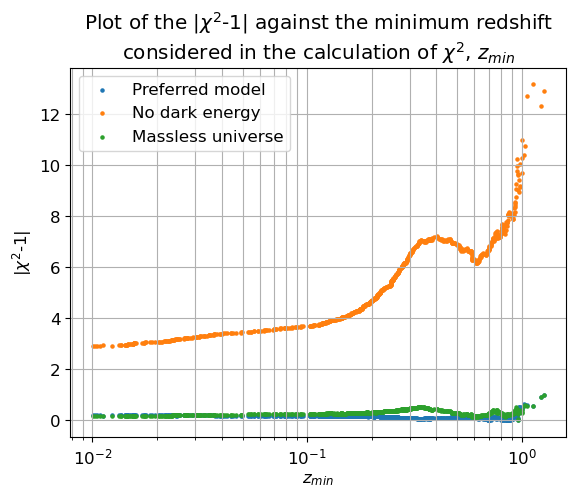

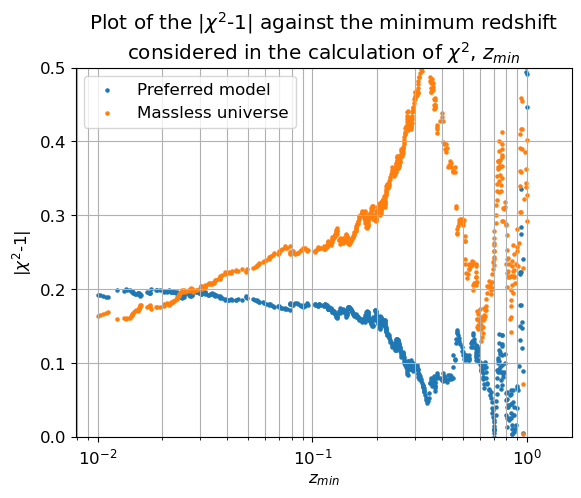

In [38]:
# Investigate different subsets of data

chi2_pref = np.array([])
chi2_noDE = np.array([])
chi2_massless = np.array([])


for i in range(len(z)):
    ind = z > z[i]

    chi2_pref = np.append(chi2_pref, chi2(mu[ind], mu_preferred[ind], mu_unc[ind]) / len(mu[ind]))
    chi2_noDE = np.append(chi2_noDE, chi2(mu[ind], mu_noDE[ind], mu_unc[ind]) / len(mu[ind]))
    chi2_massless = np.append(chi2_massless, chi2(mu[ind], mu_massless[ind], mu_unc[ind]) / len(mu[ind]))

# All 3
plt.scatter(z, np.abs(chi2_pref - 1), s=5, label='Preferred model')
plt.scatter(z, np.abs(chi2_noDE - 1), s=5, label='No dark energy')
plt.scatter(z, np.abs(chi2_massless - 1), s=5, label='Massless universe')
plt.xscale('log')
plt.grid(which='both')
plt.xlabel(r'$z_{min}$')
plt.ylabel(r'|$\chi^2$-1|')
plt.title(r'Plot of the |$\chi^2$-1| against the minimum redshift''\n''considered in the calculation of $\chi^2$, $z_{min}$')
plt.legend()
plt.show()

# Ignore no dark energy
plt.scatter(z, np.abs(chi2_pref - 1), s=5, label='Preferred model')
plt.scatter(z, np.abs(chi2_massless - 1), s=5, label='Massless universe')
plt.xscale('log')
plt.grid(which='both')
plt.xlabel(r'$z_{min}$')
plt.ylabel(r'|$\chi^2$-1|')
plt.title(r'Plot of the |$\chi^2$-1| against the minimum redshift''\n''considered in the calculation of $\chi^2$, $z_{min}$')
plt.legend()
plt.ylim([0, 0.5])
plt.show()